# Project: Identify Customer Segments

In this project, you will apply unsupervised learning techniques to identify segments of the population that form the core customer base for a mail-order sales company in Germany. These segments can then be used to direct marketing campaigns towards audiences that will have the highest expected rate of returns. The data that you will use has been provided by our partners at Bertelsmann Arvato Analytics, and represents a real-life data science task.

This notebook will help you complete this task by providing a framework within which you will perform your analysis steps. In each step of the project, you will see some text describing the subtask that you will perform, followed by one or more code cells for you to complete your work. **Feel free to add additional code and markdown cells as you go along so that you can explore everything in precise chunks.** The code cells provided in the base template will outline only the major tasks, and will usually not be enough to cover all of the minor tasks that comprise it.

It should be noted that while there will be precise guidelines on how you should handle certain tasks in the project, there will also be places where an exact specification is not provided. **There will be times in the project where you will need to make and justify your own decisions on how to treat the data.** These are places where there may not be only one way to handle the data. In real-life tasks, there may be many valid ways to approach an analysis task. One of the most important things you can do is clearly document your approach so that other scientists can understand the decisions you've made.

At the end of most sections, there will be a Markdown cell labeled **Discussion**. In these cells, you will report your findings for the completed section, as well as document the decisions that you made in your approach to each subtask. **Your project will be evaluated not just on the code used to complete the tasks outlined, but also your communication about your observations and conclusions at each stage.**

In [182]:
# import libraries here; add more as necessary
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.impute import KNNImputer
# magic word for producing visualizations in notebook
%matplotlib inline
# set options to display all rows and columns
# pd.options.display.max_rows = None
# pd.options.display.max_columns = None
'''
Import note: The classroom currently uses sklearn version 0.19.
If you need to use an imputer, it is available in sklearn.preprocessing.Imputer,
instead of sklearn.impute as in newer versions of sklearn.
'''

'\nImport note: The classroom currently uses sklearn version 0.19.\nIf you need to use an imputer, it is available in sklearn.preprocessing.Imputer,\ninstead of sklearn.impute as in newer versions of sklearn.\n'

### Step 0: Load the Data

There are four files associated with this project (not including this one):

- `Udacity_AZDIAS_Subset.csv`: Demographics data for the general population of Germany; 891211 persons (rows) x 85 features (columns).
- `Udacity_CUSTOMERS_Subset.csv`: Demographics data for customers of a mail-order company; 191652 persons (rows) x 85 features (columns).
- `Data_Dictionary.md`: Detailed information file about the features in the provided datasets.
- `AZDIAS_Feature_Summary.csv`: Summary of feature attributes for demographics data; 85 features (rows) x 4 columns

Each row of the demographics files represents a single person, but also includes information outside of individuals, including information about their household, building, and neighborhood. You will use this information to cluster the general population into groups with similar demographic properties. Then, you will see how the people in the customers dataset fit into those created clusters. The hope here is that certain clusters are over-represented in the customers data, as compared to the general population; those over-represented clusters will be assumed to be part of the core userbase. This information can then be used for further applications, such as targeting for a marketing campaign.

To start off with, load in the demographics data for the general population into a pandas DataFrame, and do the same for the feature attributes summary. Note for all of the `.csv` data files in this project: they're semicolon (`;`) delimited, so you'll need an additional argument in your [`read_csv()`](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.read_csv.html) call to read in the data properly. Also, considering the size of the main dataset, it may take some time for it to load completely.

Once the dataset is loaded, it's recommended that you take a little bit of time just browsing the general structure of the dataset and feature summary file. You'll be getting deep into the innards of the cleaning in the first major step of the project, so gaining some general familiarity can help you get your bearings.

In [183]:
# Load in the general demographics data.
azdias = pd.read_csv('Udacity_AZDIAS_Subset.csv',delimiter = ';')

# Load in the feature summary file.
feat_info = pd.read_csv('AZDIAS_Feature_Summary.csv',delimiter = ';')

In [184]:
# Check the structure of the data after it's loaded (e.g. print the number of
# rows and columns, print the first few rows).
azdias.head()

,AGER_TYP,ALTERSKATEGORIE_GROB,ANREDE_KZ,CJT_GESAMTTYP,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_VORSORGER,FINANZ_ANLEGER,FINANZ_UNAUFFAELLIGER,FINANZ_HAUSBAUER,...,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_BAUMAX,PLZ8_HHZ,PLZ8_GBZ,ARBEIT,ORTSGR_KLS9,RELAT_AB
0,-1,2,1,2.0,3,4,3,5,5,3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-1,1,2,5.0,1,5,2,5,4,5,...,2.0,3.0,2.0,1.0,1.0,5.0,4.0,3.0,5.0,4.0
2,-1,3,2,3.0,1,4,1,2,3,5,...,3.0,3.0,1.0,0.0,1.0,4.0,4.0,3.0,5.0,2.0
3,2,4,2,2.0,4,2,5,2,1,2,...,2.0,2.0,2.0,0.0,1.0,3.0,4.0,2.0,3.0,3.0
4,-1,3,1,5.0,4,3,4,1,3,2,...,2.0,4.0,2.0,1.0,2.0,3.0,3.0,4.0,6.0,5.0


In [185]:
azdias.shape

(891221, 85)

In [186]:
display(azdias.isnull().sum())

AGER_TYP                     0
ALTERSKATEGORIE_GROB         0
ANREDE_KZ                    0
CJT_GESAMTTYP             4854
FINANZ_MINIMALIST            0
                         ...  
PLZ8_HHZ                116515
PLZ8_GBZ                116515
ARBEIT                   97216
ORTSGR_KLS9              97216
RELAT_AB                 97216
Length: 85, dtype: int64

In [187]:
azdias.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891221 entries, 0 to 891220
Data columns (total 85 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   AGER_TYP               891221 non-null  int64  
 1   ALTERSKATEGORIE_GROB   891221 non-null  int64  
 2   ANREDE_KZ              891221 non-null  int64  
 3   CJT_GESAMTTYP          886367 non-null  float64
 4   FINANZ_MINIMALIST      891221 non-null  int64  
 5   FINANZ_SPARER          891221 non-null  int64  
 6   FINANZ_VORSORGER       891221 non-null  int64  
 7   FINANZ_ANLEGER         891221 non-null  int64  
 8   FINANZ_UNAUFFAELLIGER  891221 non-null  int64  
 9   FINANZ_HAUSBAUER       891221 non-null  int64  
 10  FINANZTYP              891221 non-null  int64  
 11  GEBURTSJAHR            891221 non-null  int64  
 12  GFK_URLAUBERTYP        886367 non-null  float64
 13  GREEN_AVANTGARDE       891221 non-null  int64  
 14  HEALTH_TYP             891221 non-nu

In [188]:
feat_info.columns

Index(['attribute', 'information_level', 'type', 'missing_or_unknown'], dtype='object')

In [189]:
feat_info.information_level.value_counts(dropna=False)

person            43
macrocell_plz8     8
household          7
building           7
microcell_rr3      6
region_rr1         5
microcell_rr4      3
postcode           3
community          3
Name: information_level, dtype: int64

In [190]:
feat_info.type.value_counts(dropna=False)

ordinal        49
categorical    21
numeric         7
mixed           7
interval        1
Name: type, dtype: int64

In [191]:
feat_info.tail()

,attribute,information_level,type,missing_or_unknown
80,PLZ8_HHZ,macrocell_plz8,ordinal,[-1]
81,PLZ8_GBZ,macrocell_plz8,ordinal,[-1]
82,ARBEIT,community,ordinal,"[-1,9]"
83,ORTSGR_KLS9,community,ordinal,"[-1,0]"
84,RELAT_AB,community,ordinal,"[-1,9]"




## Step 1: Preprocessing

### Step 1.1: Assess Missing Data

The feature summary file contains a summary of properties for each demographics data column. You will use this file to help you make cleaning decisions during this stage of the project. First of all, you should assess the demographics data in terms of missing data. Pay attention to the following points as you perform your analysis, and take notes on what you observe. Make sure that you fill in the **Discussion** cell with your findings and decisions at the end of each step that has one!

#### Step 1.1.1: Convert Missing Value Codes to NaNs
The fourth column of the feature attributes summary (loaded in above as `feat_info`) documents the codes from the data dictionary that indicate missing or unknown data. While the file encodes this as a list (e.g. `[-1,0]`), this will get read in as a string object. You'll need to do a little bit of parsing to make use of it to identify and clean the data. Convert data that matches a 'missing' or 'unknown' value code into a numpy NaN value. You might want to see how much data takes on a 'missing' or 'unknown' code, and how much data is naturally missing, as a point of interest.

**As one more reminder, you are encouraged to add additional cells to break up your analysis into manageable chunks.**

In [192]:
# create copies before you start manipulation
azdias_df = azdias.copy()
feat_info_df = feat_info.copy()

In [193]:
# Identify missing or unknown data values and convert them to NaNs.
feat_info_df.head()

,attribute,information_level,type,missing_or_unknown
0,AGER_TYP,person,categorical,"[-1,0]"
1,ALTERSKATEGORIE_GROB,person,ordinal,"[-1,0,9]"
2,ANREDE_KZ,person,categorical,"[-1,0]"
3,CJT_GESAMTTYP,person,categorical,[0]
4,FINANZ_MINIMALIST,person,ordinal,[-1]


In [194]:
def replace_missing_values(df, feat_info_df):
    for col in df.columns:
        missing_or_unknown = feat_info_df.query('attribute == @col')['missing_or_unknown'].values[0]
        missing_or_unknown = [i for i in missing_or_unknown.strip("[]").split(",")]
        dtype = df[col].dtype
        if dtype == 'int64':
            try:
                missing_or_unknown = list(map(int, missing_or_unknown))
            except ValueError:
                missing_or_unknown = []
        elif dtype == 'float64':
            try:
                missing_or_unknown = list(map(float, missing_or_unknown))
            except ValueError:
                missing_or_unknown = []
        df[col].replace(missing_or_unknown, np.nan, inplace=True)

In [195]:
replace_missing_values(azdias_df, feat_info_df)

In [196]:
azdias_df.shape

(891221, 85)

#### Step 1.1.2: Assess Missing Data in Each Column

How much missing data is present in each column? There are a few columns that are outliers in terms of the proportion of values that are missing. You will want to use matplotlib's [`hist()`](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.hist.html) function to visualize the distribution of missing value counts to find these columns. Identify and document these columns. While some of these columns might have justifications for keeping or re-encoding the data, for this project you should just remove them from the dataframe. (Feel free to make remarks about these outlier columns in the discussion, however!)

For the remaining features, are there any patterns in which columns have, or share, missing data?

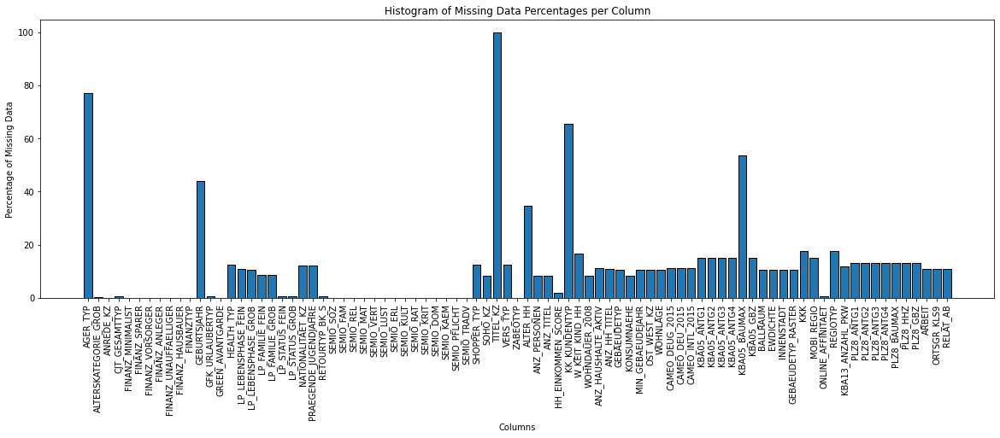

In [197]:
# Perform an assessment of how much missing data there is in each column of the
# dataset.

# Calculate percentage of missing data per column
missing_percentages = (azdias_df.isnull().sum() / len(azdias_df)) * 100

# Plot a histogram of missing data percentages per column
plt.figure(figsize=(20, 6))
plt.bar(missing_percentages.index, missing_percentages, edgecolor='k')
plt.xlabel('Columns')
plt.ylabel('Percentage of Missing Data')
plt.title('Histogram of Missing Data Percentages per Column')
plt.xticks(rotation=90)
plt.show()

There are columns that are outliers
AGER_TYP
GEBURTSJAHR
TITEL_KZ
KK_KUNDENTYP
KBA05_BAUMAX

In [198]:
azdias_df.drop(columns = ['AGER_TYP','ALTER_HH','GEBURTSJAHR','TITEL_KZ','KK_KUNDENTYP','KBA05_BAUMAX'], inplace=True)

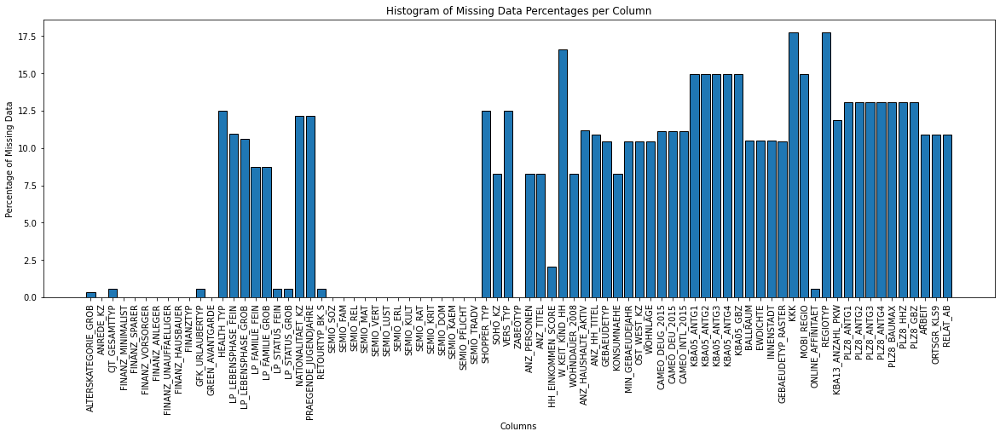

In [199]:
# Perform an assessment of how much missing data there is in each column of the
# dataset.

# Calculate percentage of missing data per column
missing_percentages = (azdias_df.isnull().sum() / len(azdias_df)) * 100

# Plot a histogram of missing data percentages per column
plt.figure(figsize=(20, 6))
plt.bar(missing_percentages.index, missing_percentages, edgecolor='k')
plt.xlabel('Columns')
plt.ylabel('Percentage of Missing Data')
plt.title('Histogram of Missing Data Percentages per Column')
plt.xticks(rotation=90)
plt.show()

In [200]:
# Investigate patterns in the amount of missing data in each column.

# Calculate percentage of missing data per column
missing_percentages = (azdias_df.isnull().sum() / len(azdias_df)) * 100
missing_percentages.max()

17.73566825736826

We have dropped columns that had a high percentages of missingness

In [201]:
azdias_df.shape

(891221, 79)

<Figure size 1440x720 with 0 Axes>

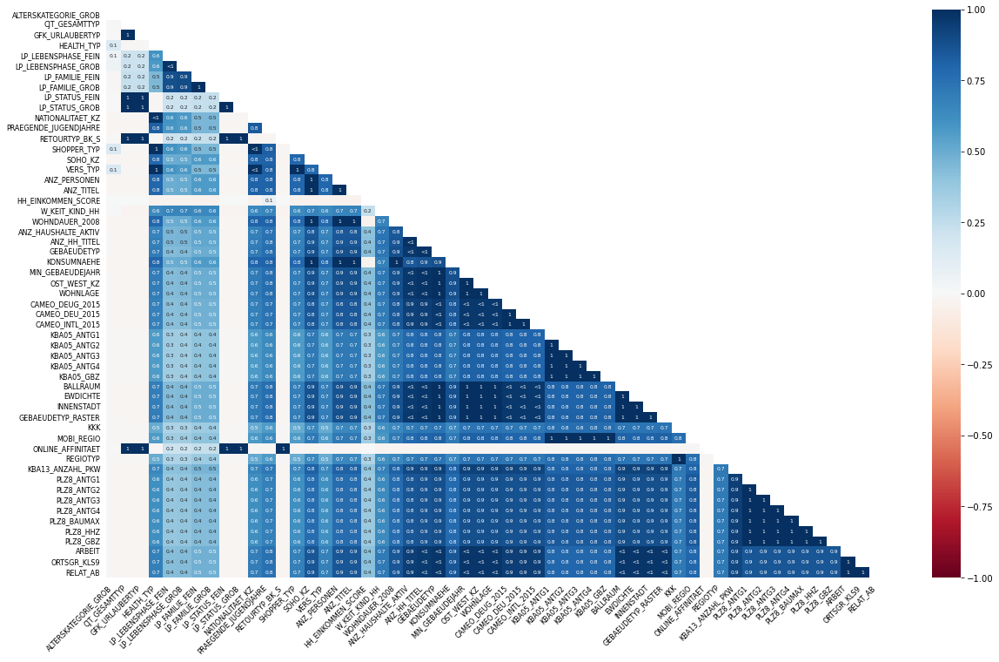

In [202]:
# Create a heatmap plot of correlated missing values
plt.figure(figsize=(20, 10))
msno.heatmap(azdias_df, fontsize=8)
plt.show();

- The heatmap is used to identify correlations of the nullity between each of the different columns. 
In other words, it can be used to identify if there is a relationship in the presence of null values between each of the columns.

- Values close to positive 1 indicate that the presence of null values in one column is correlated with the presence of null values in another column.

- Values close to negative 1 indicate that the presence of null values in one column is anti-correlated with the presence of null values in another column. In other words, when null values are present in one column, there are data values present in the other column, and vice versa.

- Values close to 0, indicate there is little to no relationship between the presence of null values in one column compared to another.

- values that show as <-1. This indicates that the correlation is very close to being 100% negative.



#### Discussion 1.1.2: Assess Missing Data in Each Column

(Double click this cell and replace this text with your own text, reporting your observations regarding the amount of missing data in each column. Are there any patterns in missing values? Which columns were removed from the dataset?)


- columns removed are ['AGER_TYP','ALTER_HH','GEBURTSJAHR','TITEL_KZ','KK_KUNDENTYP','KBA05_BAUMAX']


- 'PLZ8_ANTG1','PLZ8_ANTG2', 'PLZ8_ANTG3', 'PLZ8_ANTG4', 'PLZ8_BAUMAX', 'PLZ8_HHZ','PLZ8_GBZ' this group has a corr of +1 meaning this group has highly correlated null values 


- 'KBA05_ANTG1', 'KBA05_ANTG2','KBA05_ANTG3', 'KBA05_ANTG4', 'KBA05_GBZ' this group has a corr of +1 meaning this group has highly correlated null values 


#### Step 1.1.3: Assess Missing Data in Each Row

Now, you'll perform a similar assessment for the rows of the dataset. How much data is missing in each row? As with the columns, you should see some groups of points that have a very different numbers of missing values. Divide the data into two subsets: one for data points that are above some threshold for missing values, and a second subset for points below that threshold.

In order to know what to do with the outlier rows, we should see if the distribution of data values on columns that are not missing data (or are missing very little data) are similar or different between the two groups. Select at least five of these columns and compare the distribution of values.
- You can use seaborn's [`countplot()`](https://seaborn.pydata.org/generated/seaborn.countplot.html) function to create a bar chart of code frequencies and matplotlib's [`subplot()`](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.subplot.html) function to put bar charts for the two subplots side by side.
- To reduce repeated code, you might want to write a function that can perform this comparison, taking as one of its arguments a column to be compared.

Depending on what you observe in your comparison, this will have implications on how you approach your conclusions later in the analysis. If the distributions of non-missing features look similar between the data with many missing values and the data with few or no missing values, then we could argue that simply dropping those points from the analysis won't present a major issue. On the other hand, if the data with many missing values looks very different from the data with few or no missing values, then we should make a note on those data as special. We'll revisit these data later on. **Either way, you should continue your analysis for now using just the subset of the data with few or no missing values.**

In [203]:
# How much data is missing in each row of the dataset?

# Count the number of missing values per row
missing_values_per_row = azdias_df.isna().sum(axis=1)

# Add the summary to the original DataFrame
azdias_df['perc_missing_Values'] = (missing_values_per_row/azdias_df.shape[1])*100


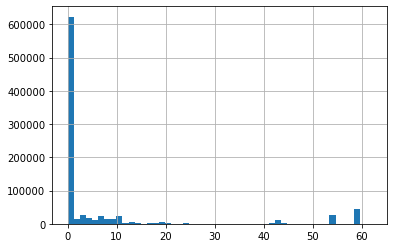

In [204]:
azdias_df['perc_missing_Values'].hist(bins=50);

In [205]:
azdias_df['perc_missing_Values'].min(),azdias_df['perc_missing_Values'].max()

(0.0, 62.0253164556962)

we have rows that have 62% of missing data

In [206]:
# Write code to divide the data into two subsets based on the number of missing
# values in each row.

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
# Replace missing values with zeros, and create a binary DataFrame
binary_df = azdias_df.fillna(0).astype(bool)
# Create a StandardScaler object
scaler = StandardScaler()
# Fit and transform the data
df_normalized = scaler.fit_transform(binary_df)
# Create a normalized dataframe
df_normalized = pd.DataFrame(df_normalized, columns=azdias_df.columns)
# Use k-means to cluster rows based on missing values
kmeans = KMeans(n_clusters=2).fit(df_normalized)

# Add the cluster IDs to the original DataFrame
azdias_df['cluster_kmeans'] = kmeans.labels_


In [207]:
azdias_df['cluster_kmeans'].value_counts()

0    797975
1     93246
Name: cluster_kmeans, dtype: int64

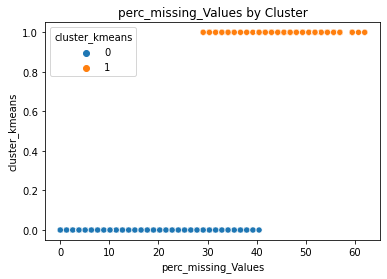

In [208]:
# Plot hue using Seaborn
sns.scatterplot(x='perc_missing_Values', y='cluster_kmeans', data=azdias_df, hue='cluster_kmeans')
plt.title('perc_missing_Values by Cluster')
plt.show()

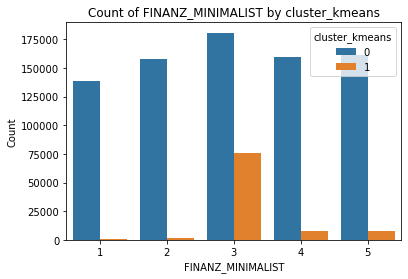

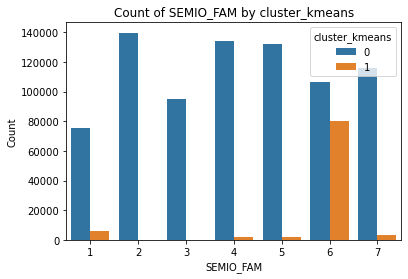

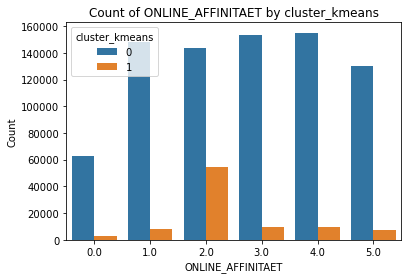

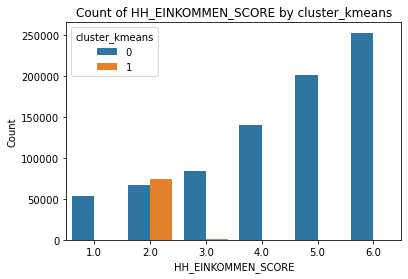

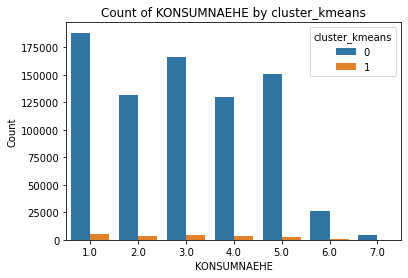

In [209]:
# Compare the distribution of values for at least five columns where there are
# no or few missing values, between the two subsets.
# Create a count plot with hue
"""columns chosen ['FINANZ_MINIMALIST','SEMIO_FAM','ONLINE_AFFINITAET','HH_EINKOMMEN_SCORE','KONSUMNAEHE'] """

for i in ['FINANZ_MINIMALIST','SEMIO_FAM','ONLINE_AFFINITAET','HH_EINKOMMEN_SCORE','KONSUMNAEHE']:
    sns.countplot(x= i, hue="cluster_kmeans", data=azdias_df)
    # Add title and axis labels
    plt.title(f"Count of {i} by cluster_kmeans")
    plt.xlabel(f"{i}")
    plt.ylabel("Count")
    # Display the plot
    plt.show()


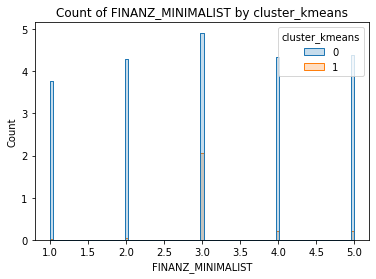

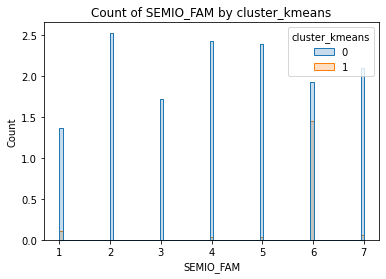

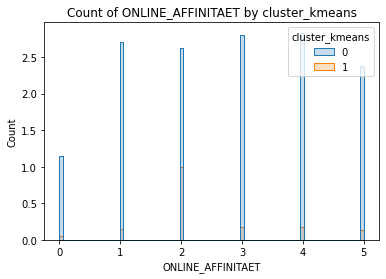

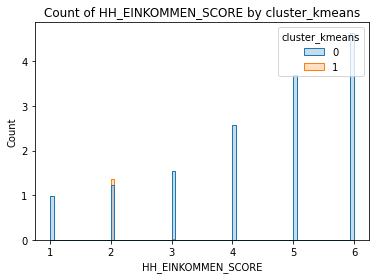

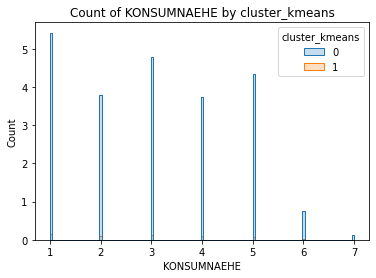

In [210]:
for i in ['FINANZ_MINIMALIST','SEMIO_FAM','ONLINE_AFFINITAET','HH_EINKOMMEN_SCORE','KONSUMNAEHE']:
    # Plot overlaid histograms
    sns.histplot(data=azdias_df, x= i, hue="cluster_kmeans", element="step", stat="density")
    # Add title and axis labels
    plt.title(f"Count of {i} by cluster_kmeans")
    plt.xlabel(f"{i}")
    plt.ylabel("Count")
    # Display the plot
    plt.show()


In [211]:
full_df = azdias_df.query('cluster_kmeans == 1')[['FINANZ_MINIMALIST','SEMIO_FAM','ONLINE_AFFINITAET','HH_EINKOMMEN_SCORE','KONSUMNAEHE']]
nulls_df = azdias_df.query('cluster_kmeans == 0')[['FINANZ_MINIMALIST','SEMIO_FAM','ONLINE_AFFINITAET','HH_EINKOMMEN_SCORE','KONSUMNAEHE']]

In [212]:
full_df.describe()

,FINANZ_MINIMALIST,SEMIO_FAM,ONLINE_AFFINITAET,HH_EINKOMMEN_SCORE,KONSUMNAEHE
count,93246.000000,93246.000000,93144.000000,74898.000000,19348.000000
mean,3.208159,5.635341,2.406886,2.008118,2.824013
std,0.648179,1.291913,1.150256,0.099873,1.521673
min,1.000000,1.000000,0.000000,1.000000,1.000000
25%,3.000000,6.000000,2.000000,2.000000,1.000000
50%,3.000000,6.000000,2.000000,2.000000,3.000000
75%,3.000000,6.000000,3.000000,2.000000,4.000000
max,5.000000,7.000000,5.000000,5.000000,7.000000


In [213]:
nulls_df.describe()

,FINANZ_MINIMALIST,SEMIO_FAM,ONLINE_AFFINITAET,HH_EINKOMMEN_SCORE,KONSUMNAEHE
count,797975.000000,797975.000000,793223.000000,797975.000000,797904.000000
mean,3.058913,4.113504,2.732957,4.413653,3.023167
std,1.377568,1.913686,1.555745,1.545205,1.550698
min,1.000000,1.000000,0.000000,1.000000,1.000000
25%,2.000000,2.000000,1.000000,3.000000,2.000000
50%,3.000000,4.000000,3.000000,5.000000,3.000000
75%,4.000000,6.000000,4.000000,6.000000,4.000000
max,5.000000,7.000000,5.000000,6.000000,7.000000


#### Discussion 1.1.3: Assess Missing Data in Each Row

I looked at 5 columns and there is qualititive diffrence between the two groups at the quantiles of those columns.

" if the data with many missing values looks very different from the data with few or no missing values, then we should make a note on those data as special."

We will continue with rows in cluster 1 

clsuter 1    797951

clsuter 0     93270

### Step 1.2: Select and Re-Encode Features

Checking for missing data isn't the only way in which you can prepare a dataset for analysis. Since the unsupervised learning techniques to be used will only work on data that is encoded numerically, you need to make a few encoding changes or additional assumptions to be able to make progress. In addition, while almost all of the values in the dataset are encoded using numbers, not all of them represent numeric values. Check the third column of the feature summary (`feat_info`) for a summary of types of measurement.
- For numeric and interval data, these features can be kept without changes.
- Most of the variables in the dataset are ordinal in nature. While ordinal values may technically be non-linear in spacing, make the simplifying assumption that the ordinal variables can be treated as being interval in nature (that is, kept without any changes).
- Special handling may be necessary for the remaining two variable types: categorical, and 'mixed'.

In the first two parts of this sub-step, you will perform an investigation of the categorical and mixed-type features and make a decision on each of them, whether you will keep, drop, or re-encode each. Then, in the last part, you will create a new data frame with only the selected and engineered columns.

Data wrangling is often the trickiest part of the data analysis process, and there's a lot of it to be done here. But stick with it: once you're done with this step, you'll be ready to get to the machine learning parts of the project!

In [214]:
# How many features are there of each data type?
feat_info.groupby('type').attribute.nunique()

type
categorical    21
interval        1
mixed           7
numeric         7
ordinal        49
Name: attribute, dtype: int64

In [215]:
feat_info.head()

,attribute,information_level,type,missing_or_unknown
0,AGER_TYP,person,categorical,"[-1,0]"
1,ALTERSKATEGORIE_GROB,person,ordinal,"[-1,0,9]"
2,ANREDE_KZ,person,categorical,"[-1,0]"
3,CJT_GESAMTTYP,person,categorical,[0]
4,FINANZ_MINIMALIST,person,ordinal,[-1]


#### Step 1.2.1: Re-Encode Categorical Features

For categorical data, you would ordinarily need to encode the levels as dummy variables. Depending on the number of categories, perform one of the following:
- For binary (two-level) categoricals that take numeric values, you can keep them without needing to do anything.
- There is one binary variable that takes on non-numeric values. For this one, you need to re-encode the values as numbers or create a dummy variable.
- For multi-level categoricals (three or more values), you can choose to encode the values using multiple dummy variables (e.g. via [OneHotEncoder](http://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.OneHotEncoder.html)), or (to keep things straightforward) just drop them from the analysis. As always, document your choices in the Discussion section.

In [216]:
cluster_sizes = azdias_df.groupby('cluster_kmeans').size()
max_cluster_kmeans = cluster_sizes.idxmax()

# Use loc to filter the dataframe and create a copy
azdias_df1 = azdias_df.loc[azdias_df['cluster_kmeans'] == max_cluster_kmeans].copy()


In [217]:
azdias_df.shape

(891221, 81)

In [218]:
azdias_df1.shape

(797975, 81)

In [219]:
azdias_df1_other = azdias_df.loc[~(azdias_df['cluster_kmeans'] == max_cluster_kmeans)].copy()


In [220]:
azdias_df1_other.shape

(93246, 81)

In [221]:
# Assess categorical variables: which are binary, which are multi-level, and
# which one needs to be re-encoded?


# Create an empty DataFrame to store the output
output_df = pd.DataFrame(columns=['Attribute', 'Category', 'Type'])

# Loop over the categorical attributes and add unique values to the dictionary
for i in list(feat_info.query("type == 'categorical'")['attribute'].unique()):
    try:
        category = 'multilevel' if len(azdias_df1[i].unique()) > 2 else 'binary'
        if category == 'binary':
            if np.issubdtype(azdias_df1[i].dtype, np.number):
                result = 'binary - numeric'
            else:
                result = 'binary - non-numeric'
        else:
            result = 'multilevel'
        output_df = output_df.append({'Attribute': i, 'Category': category, 'Type': result}, ignore_index=True)
    except:
        # If there is an error, skip and move on
        pass

# Display the output DataFrame
display(output_df)

,Attribute,Category,Type
0,ANREDE_KZ,binary,binary - numeric
1,CJT_GESAMTTYP,multilevel,multilevel
2,FINANZTYP,multilevel,multilevel
3,GFK_URLAUBERTYP,multilevel,multilevel
4,GREEN_AVANTGARDE,binary,binary - numeric
5,LP_FAMILIE_FEIN,multilevel,multilevel
6,LP_FAMILIE_GROB,multilevel,multilevel
7,LP_STATUS_FEIN,multilevel,multilevel
8,LP_STATUS_GROB,multilevel,multilevel
9,NATIONALITAET_KZ,multilevel,multilevel


In [222]:
# Re-encode categorical variable(s) to be kept in the analysis.
azdias_df1['OST_WEST_KZ'].unique()

array(['W', 'O'], dtype=object)

Building location via former East / West Germany (GDR / FRG)
- -1: unknown
-  O: East (GDR)
-  W: West (FRG)

In [223]:
# Define a mapping of the non-numeric values to integers
binary_mapping = {'W': 1, 'O': 0}

# Re-encode the binary attribute by mapping its values to integers
azdias_df1['OST_WEST_KZ'] = azdias_df1['OST_WEST_KZ'].map(binary_mapping)

there are 14 multilevel columns each with a lot of categories , I choose to drop them because of the high number of columns wil acumulate by doing this

In [224]:
azdias_df1.dtypes

ALTERSKATEGORIE_GROB    float64
ANREDE_KZ                 int64
CJT_GESAMTTYP           float64
FINANZ_MINIMALIST         int64
FINANZ_SPARER             int64
                         ...   
ARBEIT                  float64
ORTSGR_KLS9             float64
RELAT_AB                float64
perc_missing_Values     float64
cluster_kmeans            int32
Length: 81, dtype: object

In [225]:
# get dtypes of columns in df1
dtypes_df1 = azdias_df1.dtypes

# create function to map dtypes to integers
def map_dtype(dtype):
    if dtype == 'int64':
        return 1
    elif dtype == 'float64':
        return 2
    elif dtype == 'bool':
        return 3
    elif dtype == 'object':
        return 4
    else:
        return 0

# map dtypes to integers
dtypes_mapped = dtypes_df1.map(map_dtype)

# map dtypes back to strings
dtypes_mapped = dtypes_mapped.map({1: 'int', 2: 'float', 3: 'bool', 4: 'object'})

# create new column in df2 with mapped dtypes
output_df['column_types'] = output_df['Attribute'].map(dtypes_mapped)

output_df

,Attribute,Category,Type,column_types
0,ANREDE_KZ,binary,binary - numeric,int
1,CJT_GESAMTTYP,multilevel,multilevel,float
2,FINANZTYP,multilevel,multilevel,int
3,GFK_URLAUBERTYP,multilevel,multilevel,float
4,GREEN_AVANTGARDE,binary,binary - numeric,int
5,LP_FAMILIE_FEIN,multilevel,multilevel,float
6,LP_FAMILIE_GROB,multilevel,multilevel,float
7,LP_STATUS_FEIN,multilevel,multilevel,float
8,LP_STATUS_GROB,multilevel,multilevel,float
9,NATIONALITAET_KZ,multilevel,multilevel,float


In [226]:
azdias_df1['CAMEO_DEU_2015'].value_counts(dropna=False)

6B     56672
8A     52438
4C     47819
2D     35074
3C     34769
7A     34399
3D     34307
8B     33434
4A     33155
8C     30993
9D     28593
9B     27676
9C     24987
7B     24503
9A     20542
2C     19422
8D     17576
6E     16107
2B     15486
5D     14943
6C     14820
2A     13249
5A     12212
1D     11909
1A     10850
3A     10542
5B     10354
5C      9935
7C      9065
4B      9047
4D      8570
3B      7159
6A      6810
9E      6379
NaN     6110
6D      6073
6F      5392
7D      5333
4E      5321
1E      5065
7E      4633
1C      4317
5F      4283
1B      4071
5E      3581
Name: CAMEO_DEU_2015, dtype: int64

In [227]:
azdias_df1['CAMEO_DEUG_2015'].value_counts(dropna=False)

8      134441
9      108177
6      105874
4      103912
3       86777
2       83231
7       77933
5       55308
1       36212
NaN      6110
Name: CAMEO_DEUG_2015, dtype: int64

most multilevel are floats and ints

The two multilevel categories are CAMEO_DEUG_2015 and CAMEO_DEU_2015

CAMEO_DEUG_2015 looks like its int values so we will convert that to int

we will drop CAMEO_DEU_2015 as it has a lot of values and if we ohe we will get a lot of columns


In [228]:
azdias_df1['CAMEO_DEUG_2015']=azdias_df1['CAMEO_DEUG_2015'].astype('float')

In [229]:
print(azdias_df1.shape)
# Drop the multi-level categorical columns from the DataFrame
azdias_df1.drop(['CAMEO_DEU_2015'], axis=1, inplace=True)
print(azdias_df1.shape)

(797975, 81)
(797975, 80)


#### Step 1.2.2: Engineer Mixed-Type Features

There are a handful of features that are marked as "mixed" in the feature summary that require special treatment in order to be included in the analysis. There are two in particular that deserve attention; the handling of the rest are up to your own choices:
- "PRAEGENDE_JUGENDJAHRE" combines information on three dimensions: generation by decade, movement (mainstream vs. avantgarde), and nation (east vs. west). While there aren't enough levels to disentangle east from west, you should create two new variables to capture the other two dimensions: an interval-type variable for decade, and a binary variable for movement.
- "CAMEO_INTL_2015" combines information on two axes: wealth and life stage. Break up the two-digit codes by their 'tens'-place and 'ones'-place digits into two new ordinal variables (which, for the purposes of this project, is equivalent to just treating them as their raw numeric values).
- If you decide to keep or engineer new features around the other mixed-type features, make sure you note your steps in the Discussion section.

Be sure to check `Data_Dictionary.md` for the details needed to finish these tasks.

In [230]:
feat_info.query("type == 'mixed'")['attribute']

15      LP_LEBENSPHASE_FEIN
16      LP_LEBENSPHASE_GROB
22    PRAEGENDE_JUGENDJAHRE
56                 WOHNLAGE
59          CAMEO_INTL_2015
64             KBA05_BAUMAX
79              PLZ8_BAUMAX
Name: attribute, dtype: object

P_LEBENSPHASE_FEIN is a mixed variable type , it looks like it is decomposed into LP_STATUS_GROB ,LP_STATUS_FEIN,LP_FAMILIE_GROB
LP_FAMILIE_FEIN,LP_LEBENSPHASE_GROB


KBA05_BAUMAX, PLZ8_BAUMAX ,WOHNLAGE don't have to be decomposed further




In [231]:
azdias_df1['PRAEGENDE_JUGENDJAHRE'].value_counts(dropna=False)

14.0    182973
8.0     141617
10.0     85801
5.0      84685
3.0      53844
15.0     42544
11.0     35752
9.0      33570
NaN      28710
6.0      25652
12.0     24445
1.0      20678
4.0      20451
2.0       7479
13.0      5764
7.0       4010
Name: PRAEGENDE_JUGENDJAHRE, dtype: int64

In [232]:
azdias_df1['PRAEGENDE_JUGENDJAHRE'].dtype

dtype('float64')

In [233]:
azdias_df1['PRAEGENDE_JUGENDJAHRE'].isnull().sum()

28710

In [234]:
# Create a mapping between category numbers and names
categories = {-1: 'unknown', 0: 'unknown', 1: '40s - war years (Mainstream, E+W)', 2: '40s - reconstruction years (Avantgarde, E+W)', 3: '50s - economic miracle (Mainstream, E+W)', 4: '50s - milk bar / Individualisation (Avantgarde, E+W)', 5: '60s - economic miracle (Mainstream, E+W)', 6: '60s - generation 68 / student protestors (Avantgarde, W)', 7: '60s - opponents to the building of the Wall (Avantgarde, E)', 8: '70s - family orientation (Mainstream, E+W)', 9: '70s - peace movement (Avantgarde, E+W)', 10: '80s - Generation Golf (Mainstream, W)', 11: '80s - ecological awareness (Avantgarde, W)', 12: '80s - FDJ / communist party youth organisation (Mainstream, E)', 13: '80s - Swords into ploughshares (Avantgarde, E)', 14: '90s - digital media kids (Mainstream, E+W)', 15: '90s - ecological awareness (Avantgarde, E+W)'}

# Map the category numbers to category names using the categories dictionary
azdias_df1['PRAEGENDE_JUGENDJAHRE_map']= azdias_df1['PRAEGENDE_JUGENDJAHRE'].map(categories)


In [235]:
azdias_df1['PRAEGENDE_JUGENDJAHRE_map'].value_counts(dropna=False)

90s - digital media kids (Mainstream, E+W)                        182973
70s - family orientation (Mainstream, E+W)                        141617
80s - Generation Golf (Mainstream, W)                              85801
60s - economic miracle (Mainstream, E+W)                           84685
50s - economic miracle (Mainstream, E+W)                           53844
90s - ecological awareness (Avantgarde, E+W)                       42544
80s - ecological awareness (Avantgarde, W)                         35752
70s - peace movement (Avantgarde, E+W)                             33570
NaN                                                                28710
60s - generation 68 / student protestors (Avantgarde, W)           25652
80s - FDJ / communist party youth organisation (Mainstream, E)     24445
40s - war years (Mainstream, E+W)                                  20678
50s - milk bar / Individualisation (Avantgarde, E+W)               20451
40s - reconstruction years (Avantgarde, E+W)       

In [236]:
azdias_df1['PRAEGENDE_JUGENDJAHRE_map']

1           90s - digital media kids (Mainstream, E+W)
2         90s - ecological awareness (Avantgarde, E+W)
3           70s - family orientation (Mainstream, E+W)
4           70s - family orientation (Mainstream, E+W)
5             50s - economic miracle (Mainstream, E+W)
                              ...                     
891216      90s - digital media kids (Mainstream, E+W)
891217           80s - Generation Golf (Mainstream, W)
891218      90s - digital media kids (Mainstream, E+W)
891219      90s - digital media kids (Mainstream, E+W)
891220        50s - economic miracle (Mainstream, E+W)
Name: PRAEGENDE_JUGENDJAHRE_map, Length: 797975, dtype: object

In [237]:
# define a function to extract the decade and movement from the 'PRAEGENDE_JUGENDJAHRE_map' values
def extract_decade_and_movement(val):
    if isinstance(val, float):
        return np.nan, np.nan
    parts = val.split(' - ')
    if len(parts) < 2:
        return np.nan, np.nan
    decade = parts[0] + ' - ' + parts[1].split('(')[0].strip()
    split_parts = parts[1].split('(')
    if len(split_parts) < 2:
        return decade, np.nan
    movement = split_parts[1].split(',')[0].strip()
    return decade, movement

# apply the function to the 'PRAEGENDE_JUGENDJAHRE_map' column
azdias_df1[['decade', 'movement']] = azdias_df1['PRAEGENDE_JUGENDJAHRE_map'].apply(lambda x: pd.Series(extract_decade_and_movement(x)))



In [238]:
# Create a mapping between category numbers and names
wealth_ranks = {
    '-1': 'unknown',
    '11': 'Wealthy Households - Pre-Family Couples & Singles',
    '12': 'Wealthy Households - Young Couples With Children',
    '13': 'Wealthy Households - Families With School Age Children',
    '14': 'Wealthy Households - Older Families & Mature Couples',
    '15': 'Wealthy Households - Elders In Retirement',
    '21': 'Prosperous Households - Pre-Family Couples & Singles',
    '22': 'Prosperous Households - Young Couples With Children',
    '23': 'Prosperous Households - Families With School Age Children',
    '24': 'Prosperous Households - Older Families & Mature Couples',
    '25': 'Prosperous Households - Elders In Retirement',
    '31': 'Comfortable Households - Pre-Family Couples & Singles',
    '32': 'Comfortable Households - Young Couples With Children',
    '33': 'Comfortable Households - Families With School Age Children',
    '34': 'Comfortable Households - Older Families & Mature Couples',
    '35': 'Comfortable Households - Elders In Retirement',
    '41': 'Less Affluent Households - Pre-Family Couples & Singles',
    '42': 'Less Affluent Households - Young Couples With Children',
    '43': 'Less Affluent Households - Families With School Age Children',
    '44': 'Less Affluent Households - Older Families & Mature Couples',
    '45': 'Less Affluent Households - Elders In Retirement',
    '51': 'Poorer Households - Pre-Family Couples & Singles',
    '52': 'Poorer Households - Young Couples With Children',
    '53': 'Poorer Households - Families With School Age Children',
    '54': 'Poorer Households - Older Families & Mature Couples',
    '55': 'Poorer Households - Elders In Retirement',
    'XX': 'unknown'
}
# Map the category numbers to category names using the categories dictionary
azdias_df1['CAMEO_INTL_2015_map']= azdias_df1['CAMEO_INTL_2015'].map(wealth_ranks)


In [239]:
azdias_df1['CAMEO_INTL_2015'].value_counts(dropna=False)

51     133694
41      92336
24      91158
14      62884
43      56672
54      45391
25      39628
22      33155
23      26748
13      26336
45      26132
55      23955
52      20542
31      19022
34      18524
15      16974
44      14820
12      13249
35      10356
32      10354
33       9935
NaN      6110
Name: CAMEO_INTL_2015, dtype: int64

In [240]:
azdias_df1['CAMEO_INTL_2015_map'].value_counts(dropna=False)

Poorer Households - Pre-Family Couples & Singles                133694
Less Affluent Households - Pre-Family Couples & Singles          92336
Prosperous Households - Older Families & Mature Couples          91158
Wealthy Households - Older Families & Mature Couples             62884
Less Affluent Households - Families With School Age Children     56672
Poorer Households - Older Families & Mature Couples              45391
Prosperous Households - Elders In Retirement                     39628
Prosperous Households - Young Couples With Children              33155
Prosperous Households - Families With School Age Children        26748
Wealthy Households - Families With School Age Children           26336
Less Affluent Households - Elders In Retirement                  26132
Poorer Households - Elders In Retirement                         23955
Poorer Households - Young Couples With Children                  20542
Comfortable Households - Pre-Family Couples & Singles            19022
Comfor

In [241]:
# define a function to extract the  Wealth and Life Stage Typology from the 'CAMEO_INTL_2015' values
def extract_wealth_and_life_stage_typology(val):
    if isinstance(val, float):
        return np.nan, np.nan
    parts = val.split(' - ')
    if len(parts) < 2:
        return np.nan, np.nan
    Wealth = parts[0].strip()
    Life_Stage_Typology = parts[1].strip()
    return Wealth, Life_Stage_Typology

# apply the function to the 'PRAEGENDE_JUGENDJAHRE_map' column
azdias_df1[['Wealth', 'Life_Stage_Typology']] = azdias_df1['CAMEO_INTL_2015_map'].apply(lambda x: pd.Series(extract_wealth_and_life_stage_typology(x)))



In [242]:
azdias_df1.head()

,ALTERSKATEGORIE_GROB,ANREDE_KZ,CJT_GESAMTTYP,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_VORSORGER,FINANZ_ANLEGER,FINANZ_UNAUFFAELLIGER,FINANZ_HAUSBAUER,FINANZTYP,...,ORTSGR_KLS9,RELAT_AB,perc_missing_Values,cluster_kmeans,PRAEGENDE_JUGENDJAHRE_map,decade,movement,CAMEO_INTL_2015_map,Wealth,Life_Stage_Typology
1,1.0,2,5.0,1,5,2,5,4,5,1,...,5.0,4.0,0.000000,0,"90s - digital media kids (Mainstream, E+W)",90s - digital media kids,Mainstream,Poorer Households - Pre-Family Couples & Singles,Poorer Households,Pre-Family Couples & Singles
2,3.0,2,3.0,1,4,1,2,3,5,1,...,5.0,2.0,0.000000,0,"90s - ecological awareness (Avantgarde, E+W)",90s - ecological awareness,Avantgarde,Prosperous Households - Older Families & Matur...,Prosperous Households,Older Families & Mature Couples
3,4.0,2,2.0,4,2,5,2,1,2,6,...,3.0,3.0,8.860759,0,"70s - family orientation (Mainstream, E+W)",70s - family orientation,Mainstream,Wealthy Households - Young Couples With Children,Wealthy Households,Young Couples With Children
4,3.0,1,5.0,4,3,4,1,3,2,5,...,6.0,5.0,0.000000,0,"70s - family orientation (Mainstream, E+W)",70s - family orientation,Mainstream,Less Affluent Households - Families With Schoo...,Less Affluent Households,Families With School Age Children
5,1.0,2,2.0,3,1,5,2,2,5,2,...,3.0,3.0,0.000000,0,"50s - economic miracle (Mainstream, E+W)",50s - economic miracle,Mainstream,Poorer Households - Older Families & Mature Co...,Poorer Households,Older Families & Mature Couples


In [243]:
print(azdias_df1.shape)
# drop the original columns
azdias_df1 = azdias_df1.drop(['PRAEGENDE_JUGENDJAHRE','PRAEGENDE_JUGENDJAHRE_map','CAMEO_INTL_2015','CAMEO_INTL_2015_map'], axis=1)
print(azdias_df1.shape)

(797975, 86)
(797975, 82)


#### Step 1.2.3: Complete Feature Selection

In order to finish this step up, you need to make sure that your data frame now only has the columns that you want to keep. To summarize, the dataframe should consist of the following:
- All numeric, interval, and ordinal type columns from the original dataset.
- Binary categorical features (all numerically-encoded).
- Engineered features from other multi-level categorical features and mixed features.

Make sure that for any new columns that you have engineered, that you've excluded the original columns from the final dataset. Otherwise, their values will interfere with the analysis later on the project. For example, you should not keep "PRAEGENDE_JUGENDJAHRE", since its values won't be useful for the algorithm: only the values derived from it in the engineered features you created should be retained. As a reminder, your data should only be from **the subset with few or no missing values**.

In [244]:
# If there are other re-engineering tasks you need to perform, make sure you
# take care of them here. (Dealing with missing data will come in step 2.1.)

azdias_df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 797975 entries, 1 to 891220
Data columns (total 82 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   ALTERSKATEGORIE_GROB   795173 non-null  float64
 1   ANREDE_KZ              797975 non-null  int64  
 2   CJT_GESAMTTYP          793223 non-null  float64
 3   FINANZ_MINIMALIST      797975 non-null  int64  
 4   FINANZ_SPARER          797975 non-null  int64  
 5   FINANZ_VORSORGER       797975 non-null  int64  
 6   FINANZ_ANLEGER         797975 non-null  int64  
 7   FINANZ_UNAUFFAELLIGER  797975 non-null  int64  
 8   FINANZ_HAUSBAUER       797975 non-null  int64  
 9   FINANZTYP              797975 non-null  int64  
 10  GFK_URLAUBERTYP        793223 non-null  float64
 11  GREEN_AVANTGARDE       797975 non-null  int64  
 12  HEALTH_TYP             761288 non-null  float64
 13  LP_LEBENSPHASE_FEIN    747826 non-null  float64
 14  LP_LEBENSPHASE_GROB    750709 non-nu

In [245]:
# drop the perc_missing_Values and cluster_kmeans values
print(azdias_df1.shape)
azdias_df1.drop(['perc_missing_Values','cluster_kmeans'],axis=1,inplace=True)
print(azdias_df1.shape)

(797975, 82)
(797975, 80)


In [246]:
azdias_df1['decade'].value_counts(dropna=False)

90s - digital media kids                          182973
70s - family orientation                          141617
80s - Generation Golf                              85801
60s - economic miracle                             84685
50s - economic miracle                             53844
90s - ecological awareness                         42544
80s - ecological awareness                         35752
70s - peace movement                               33570
NaN                                                28710
60s - generation 68 / student protestors           25652
80s - FDJ / communist party youth organisation     24445
40s - war years                                    20678
50s - milk bar / Individualisation                 20451
40s - reconstruction years                          7479
80s - Swords into ploughshares                      5764
60s - opponents to the building of the Wall         4010
Name: decade, dtype: int64

In [247]:
# ohe decade,movement,Wealth,Life_Stage_Typology
def one_hot_encode_col(df, col_name, prefix=None):
    # one-hot encode the specified column and add prefix to new column names
    ohe_df = pd.get_dummies(df[col_name], prefix=col_name+'_ohe_',drop_first=True)
    
    # concatenate the original dataframe with the one-hot encoded dataframe
    df = pd.concat([df, ohe_df], axis=1)
    
    return df

print(azdias_df1.shape)

# Create SimpleImputer object and fit it to data
imputer = SimpleImputer(strategy='constant', fill_value='unknown')
imputer.fit(azdias_df1[['decade','movement','Wealth','Life_Stage_Typology']])

# Replace nulls with "unknown" using the imputer
azdias_df1[['decade','movement','Wealth','Life_Stage_Typology']] = imputer.transform(azdias_df1[['decade','movement','Wealth','Life_Stage_Typology']])

# call function to one-hot encode the column with prefix 'ohe_'
for col in ['decade','movement','Wealth','Life_Stage_Typology']:
    azdias_df1 = one_hot_encode_col(azdias_df1, col, col+'_ohe_')

    
azdias_df1.drop(columns=['decade','movement','Wealth','Life_Stage_Typology'],inplace=True)
print(azdias_df1.shape)

(797975, 80)
(797975, 103)


### Step 1.3: Create a Cleaning Function

Even though you've finished cleaning up the general population demographics data, it's important to look ahead to the future and realize that you'll need to perform the same cleaning steps on the customer demographics data. In this substep, complete the function below to execute the main feature selection, encoding, and re-engineering steps you performed above. Then, when it comes to looking at the customer data in Step 3, you can just run this function on that DataFrame to get the trimmed dataset in a single step.

In [149]:
def clean_data(df):
    """
    Perform feature trimming, re-encoding, and engineering for demographics
    data
    
    INPUT: Demographics DataFrame
    OUTPUT: Trimmed and cleaned demographics DataFrame
    """
    
    # Put in code here to execute all main cleaning steps:
    # convert missing value codes into NaNs, ...
    replace_missing_values(df, feat_info_df)
    
    # remove selected columns and rows, ...
    df.drop(columns = ['AGER_TYP','ALTER_HH','GEBURTSJAHR','TITEL_KZ','KK_KUNDENTYP','KBA05_BAUMAX'], inplace=True)
    # Replace missing values with zeros, and create a binary DataFrame
    binary_df = df.fillna(0).astype(bool)
    # Create a StandardScaler object
    scaler = StandardScaler()
    # Fit and transform the data
    df_normalized = scaler.fit_transform(binary_df)
    # Create a normalized dataframe
    df_normalized = pd.DataFrame(df_normalized, columns=df.columns)
    # Use k-means to cluster rows based on missing values
    kmeans = KMeans(n_clusters=2).fit(df_normalized)
    
    # Add the cluster IDs to the original DataFrame
    df['cluster_kmeans'] = kmeans.labels_
    # Add the cluster IDs to the original DataFrame
    cluster_sizes = df.groupby('cluster_kmeans').size()
    max_cluster_kmeans = cluster_sizes.idxmax()
    print(df.shape)
    df_cluster = df.copy()
    print(df_cluster.shape)
    # Use loc to filter the dataframe and create a copy
    df = df.loc[df['cluster_kmeans'] == max_cluster_kmeans].copy()
    print(df.shape)
    df_other = df_cluster.loc[~(df_cluster['cluster_kmeans'] == max_cluster_kmeans)].copy()
    print(df_other.shape)
    # select, re-encode, and engineer column values.

    # Define a mapping of the non-numeric values to integers
    binary_mapping = {'W': 1, 'O': 0}

    # Re-encode the binary attribute by mapping its values to integers
    df['OST_WEST_KZ'] = df['OST_WEST_KZ'].map(binary_mapping)
    
    df['CAMEO_DEUG_2015']=df['CAMEO_DEUG_2015'].astype('float')
    
    # Drop the multi-level categorical columns from the DataFrame
    df.drop(['CAMEO_DEU_2015'], axis=1, inplace=True)
    

    # Map the category numbers to category names using the categories dictionary
    df['PRAEGENDE_JUGENDJAHRE_map']= df['PRAEGENDE_JUGENDJAHRE'].map(categories)

    # apply the function to the 'PRAEGENDE_JUGENDJAHRE_map' column
    df[['decade', 'movement']] = df['PRAEGENDE_JUGENDJAHRE_map'].apply(lambda x: pd.Series(extract_decade_and_movement(x)))


    # Create a mapping between category numbers and names

    # Map the category numbers to category names using the categories dictionary
    df['CAMEO_INTL_2015_map']= df['CAMEO_INTL_2015'].map(wealth_ranks)


    # apply the function to the 'PRAEGENDE_JUGENDJAHRE_map' column
    df[['Wealth', 'Life_Stage_Typology']] = df['CAMEO_INTL_2015_map'].apply(lambda x: pd.Series(extract_wealth_and_life_stage_typology(x)))


    df = df.drop(['PRAEGENDE_JUGENDJAHRE','PRAEGENDE_JUGENDJAHRE_map','CAMEO_INTL_2015','CAMEO_INTL_2015_map'], axis=1)

    df.drop(['cluster_kmeans'],axis=1,inplace=True)
     
    # Create SimpleImputer object and fit it to data
    imputer = SimpleImputer(strategy='constant', fill_value='unknown')
    imputer.fit(df[['decade','movement','Wealth','Life_Stage_Typology']])

    # Replace nulls with "unknown" using the imputer
    df[['decade','movement','Wealth','Life_Stage_Typology']] = imputer.transform(df[['decade','movement','Wealth','Life_Stage_Typology']])


    for col in ['decade','movement','Wealth','Life_Stage_Typology']:
        df = one_hot_encode_col(df, col, col+'_ohe_')
   

      
    df.drop(columns=['decade','movement','Wealth','Life_Stage_Typology'],inplace=True)
    # Return the cleaned dataframe.
    return df,df_other
    

## Step 2: Feature Transformation

### Step 2.1: Apply Feature Scaling

Before we apply dimensionality reduction techniques to the data, we need to perform feature scaling so that the principal component vectors are not influenced by the natural differences in scale for features. Starting from this part of the project, you'll want to keep an eye on the [API reference page for sklearn](http://scikit-learn.org/stable/modules/classes.html) to help you navigate to all of the classes and functions that you'll need. In this substep, you'll need to check the following:

- sklearn requires that data not have missing values in order for its estimators to work properly. So, before applying the scaler to your data, make sure that you've cleaned the DataFrame of the remaining missing values. This can be as simple as just removing all data points with missing data, or applying an [Imputer](https://scikit-learn.org/0.16/modules/generated/sklearn.preprocessing.Imputer.html) to replace all missing values. You might also try a more complicated procedure where you temporarily remove missing values in order to compute the scaling parameters before re-introducing those missing values and applying imputation. Think about how much missing data you have and what possible effects each approach might have on your analysis, and justify your decision in the discussion section below.
- For the actual scaling function, a [StandardScaler](http://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html) instance is suggested, scaling each feature to mean 0 and standard deviation 1.
- For these classes, you can make use of the `.fit_transform()` method to both fit a procedure to the data as well as apply the transformation to the data at the same time. Don't forget to keep the fit sklearn objects handy, since you'll be applying them to the customer demographics data towards the end of the project.

In [66]:
# If you've not yet cleaned the dataset of all NaN values, then investigate and
# do that now.
azdias_df1.isnull().sum()

ALTERSKATEGORIE_GROB                                          2802
ANREDE_KZ                                                        0
CJT_GESAMTTYP                                                 4752
FINANZ_MINIMALIST                                                0
FINANZ_SPARER                                                    0
                                                              ... 
Life_Stage_Typology_ohe__Families With School Age Children       0
Life_Stage_Typology_ohe__Older Families & Mature Couples         0
Life_Stage_Typology_ohe__Pre-Family Couples & Singles            0
Life_Stage_Typology_ohe__Young Couples With Children             0
Life_Stage_Typology_ohe__unknown                                 0
Length: 103, dtype: int64

there are columns with a lot of missing values

In [100]:
from sklearn.impute import SimpleImputer

# scale data using StandardScaler
scaler = StandardScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(azdias_df1), columns=azdias_df1.columns)

# re-introduce missing values using SimpleImputer
imputer = SimpleImputer(missing_values=np.nan, strategy='mean')
azdias_df1_scaled = pd.DataFrame(imputer.fit_transform(df_scaled), columns=azdias_df1.columns)

In [101]:
print(azdias_df1.shape)

(797975, 103)


In [102]:
print(azdias_df1_scaled.shape)

(797975, 103)


In [70]:
azdias_df1_scaled.isnull().sum()

ALTERSKATEGORIE_GROB                                          0
ANREDE_KZ                                                     0
CJT_GESAMTTYP                                                 0
FINANZ_MINIMALIST                                             0
FINANZ_SPARER                                                 0
                                                             ..
Life_Stage_Typology_ohe__Families With School Age Children    0
Life_Stage_Typology_ohe__Older Families & Mature Couples      0
Life_Stage_Typology_ohe__Pre-Family Couples & Singles         0
Life_Stage_Typology_ohe__Young Couples With Children          0
Life_Stage_Typology_ohe__unknown                              0
Length: 103, dtype: int64

In [71]:
# # import the necessary libraries
# import pandas as pd
# from sklearn.preprocessing import StandardScaler
# from sklearn.impute import KNNImputer


# # create mask to select non-null values
# not_null_mask = azdias_df1.notnull()

# # use the mask to scale only non-null values
# scaler = StandardScaler()
# data_scaled = scaler.fit_transform(azdias_df1[not_null_mask])

# # create the KNN imputer object and impute the missing values
# imputer = KNNImputer()
# data_imputed = imputer.fit_transform(data_scaled)

# # create a new dataframe from the imputed data
# data_imputed_df = pd.DataFrame(data_imputed, columns=azdias_df1.columns)

# # replace null values with imputed values
# data_imputed_df = data_imputed_df.combine_first(azdias_df1)

### Discussion 2.1: Apply Feature Scaling

scaling is done only on the non-null values, caling scaling before imputation ensures that the imputed values are consistent with the distribution of existing values
re-introduce missing values using SimpleImputer

### Step 2.2: Perform Dimensionality Reduction

On your scaled data, you are now ready to apply dimensionality reduction techniques.

- Use sklearn's [PCA](http://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html) class to apply principal component analysis on the data, thus finding the vectors of maximal variance in the data. To start, you should not set any parameters (so all components are computed) or set a number of components that is at least half the number of features (so there's enough features to see the general trend in variability).
- Check out the ratio of variance explained by each principal component as well as the cumulative variance explained. Try plotting the cumulative or sequential values using matplotlib's [`plot()`](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.plot.html) function. Based on what you find, select a value for the number of transformed features you'll retain for the clustering part of the project.
- Once you've made a choice for the number of components to keep, make sure you re-fit a PCA instance to perform the decided-on transformation.

In [72]:
# Apply PCA to the data.
from sklearn.decomposition import PCA
from helper_functions import do_pca, scree_plot, plot_components, pca_results

In [73]:
pca, X_pca = do_pca(azdias_df1_scaled)

In [74]:
pca.components_.shape

(103, 103)

,Explained Variance,ALTERSKATEGORIE_GROB,ANREDE_KZ,CJT_GESAMTTYP,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_VORSORGER,FINANZ_ANLEGER,FINANZ_UNAUFFAELLIGER,FINANZ_HAUSBAUER,...,Wealth_ohe__Less Affluent Households,Wealth_ohe__Poorer Households,Wealth_ohe__Prosperous Households,Wealth_ohe__Wealthy Households,Wealth_ohe__unknown,Life_Stage_Typology_ohe__Families With School Age Children,Life_Stage_Typology_ohe__Older Families & Mature Couples,Life_Stage_Typology_ohe__Pre-Family Couples & Singles,Life_Stage_Typology_ohe__Young Couples With Children,Life_Stage_Typology_ohe__unknown
Dimension 1,0.1413,-0.0729,0.0151,0.0275,-0.1883,0.1018,-0.0732,0.0420,0.0391,0.1584,...,0.0402,0.1555,-0.1090,-0.1070,-0.0067,-0.0559,-0.0649,0.1447,-0.0367,-0.0067
Dimension 2,0.0915,0.2655,0.0668,-0.1265,0.1038,-0.2502,0.2401,-0.2115,-0.2337,0.0821,...,0.0132,0.0362,-0.0361,-0.0152,-0.0041,-0.0244,-0.0033,0.0132,-0.0325,-0.0041
Dimension 3,0.0623,0.0525,-0.3622,-0.0295,0.1498,-0.0869,0.0778,-0.1716,-0.0861,-0.0528,...,0.0051,0.0277,-0.0318,-0.0015,0.0007,-0.0184,-0.0095,0.0312,-0.0207,0.0007
Dimension 4,0.0471,-0.0206,0.0518,0.0720,0.0152,0.0132,-0.0188,-0.0559,0.0416,-0.0406,...,-0.0159,0.0065,-0.0581,0.0766,-0.0198,-0.0346,0.0284,0.0189,-0.0303,-0.0198
Dimension 5,0.0370,0.0419,-0.0190,0.0049,0.0047,-0.0241,0.0271,0.0599,-0.1088,0.0256,...,0.0091,0.0997,0.0018,-0.1235,-0.0079,0.0075,-0.0828,0.0492,0.0499,-0.0079
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Dimension 99,0.0000,0.0014,0.0023,-0.0005,-0.0099,0.0023,0.0120,0.0086,0.0028,0.0037,...,0.0001,-0.0014,-0.0014,-0.0018,0.0002,-0.0005,-0.0001,-0.0013,0.0007,0.0002
Dimension 100,0.0000,0.0000,0.0000,0.0000,-0.0000,0.0000,0.0000,-0.0000,-0.0000,-0.0000,...,0.0000,0.0000,0.0000,-0.0000,0.0379,-0.0000,-0.0000,-0.0000,-0.0000,-0.0379
Dimension 101,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,-0.0000,-0.0000,0.0000,0.0000,...,-0.0000,0.0000,-0.0000,-0.0000,0.0282,-0.0000,-0.0000,0.0000,-0.0000,-0.0282
Dimension 102,0.0000,0.0000,-0.0000,0.0000,-0.0000,0.0000,-0.0000,-0.0000,0.0000,-0.0000,...,-0.0000,-0.0000,-0.0000,0.0000,-0.4246,-0.0000,-0.0000,-0.0000,-0.0000,0.4246


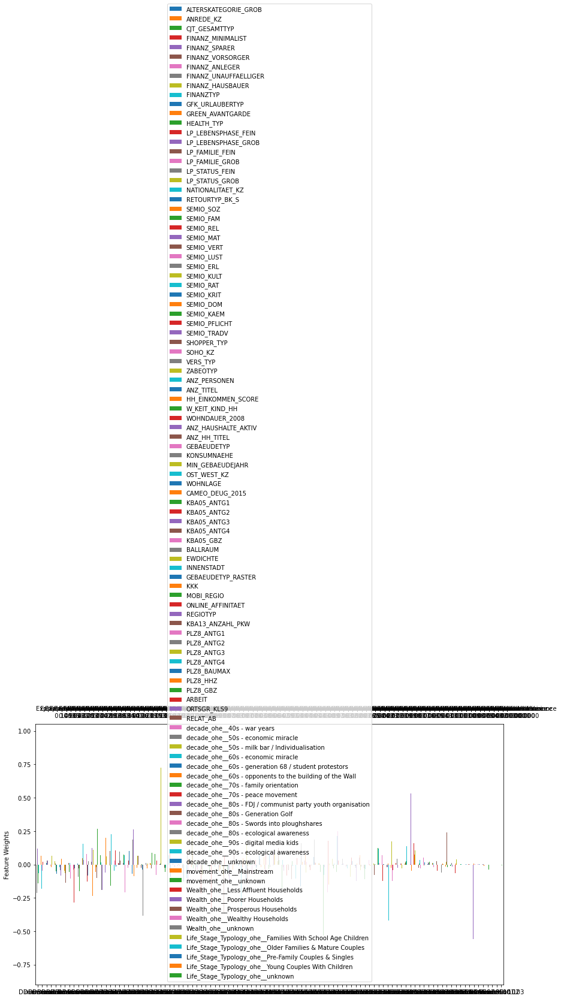

In [75]:
pca_results(azdias_df1_scaled,pca)

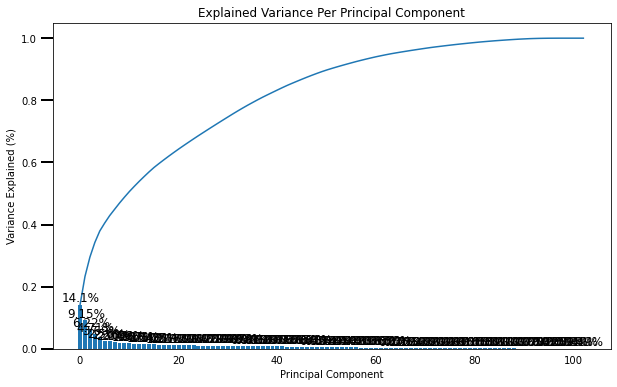

In [76]:
# Investigate the variance accounted for by each principal component.
scree_plot(pca)


C:\Users\JWAITHIRA\Desktop\Udacity_DataScientist\intro-to-ml-tensorflow\projects\p3_customer_segmentation\helper_functions.py:215: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize = (14,8))


Using 44 components, we can explain 0.8545000000000001% of the variability in the original data.


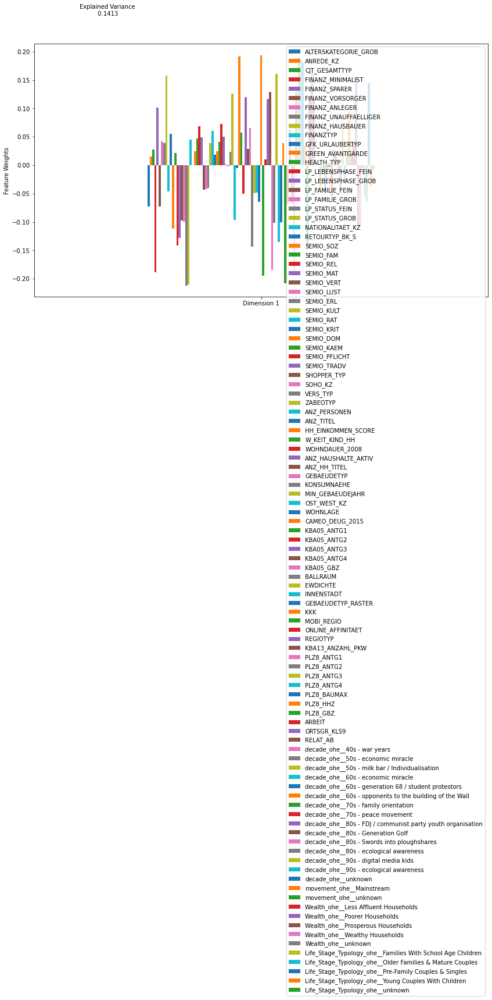

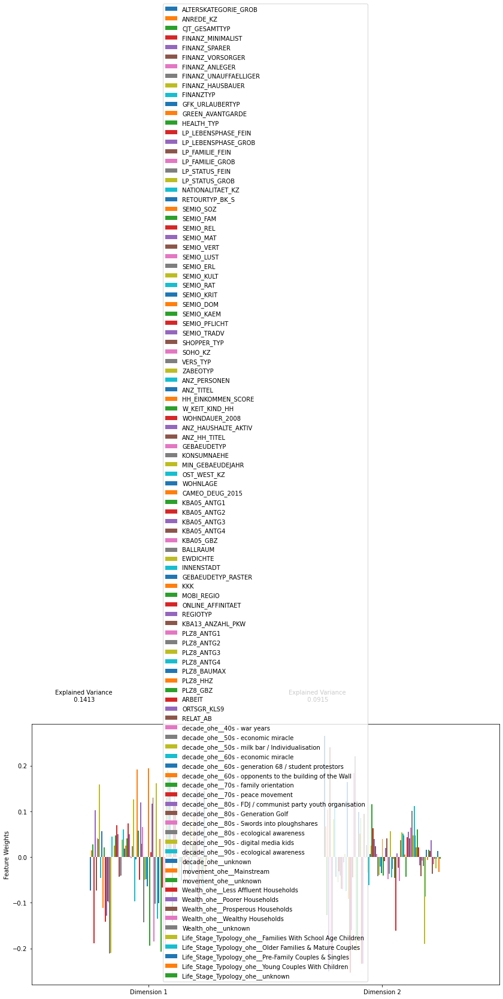

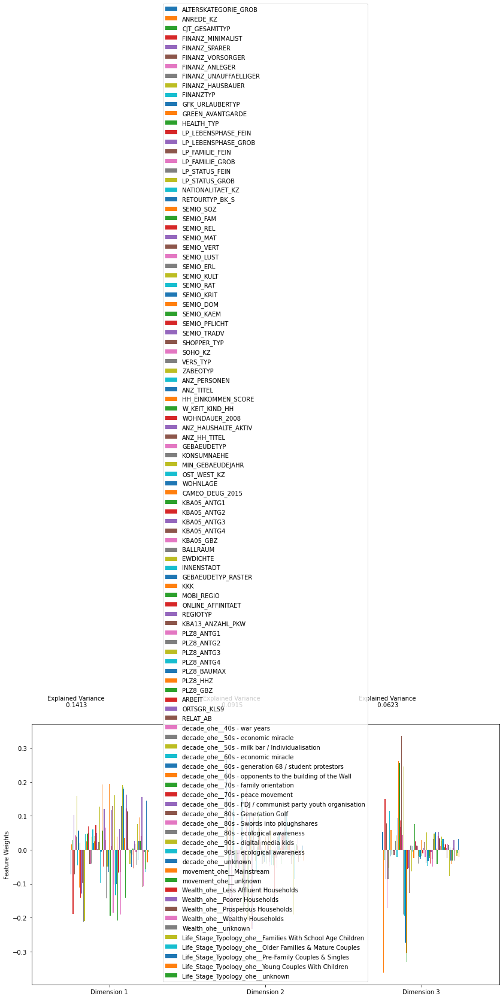

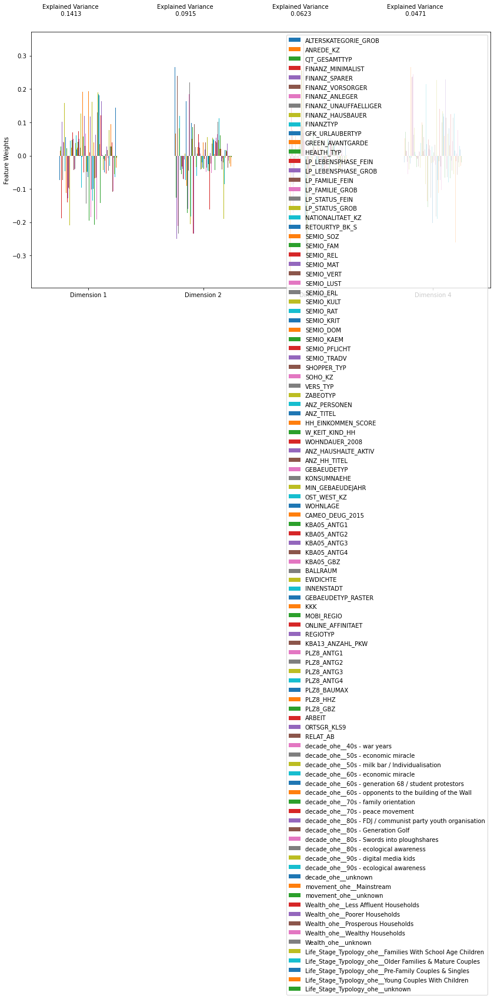

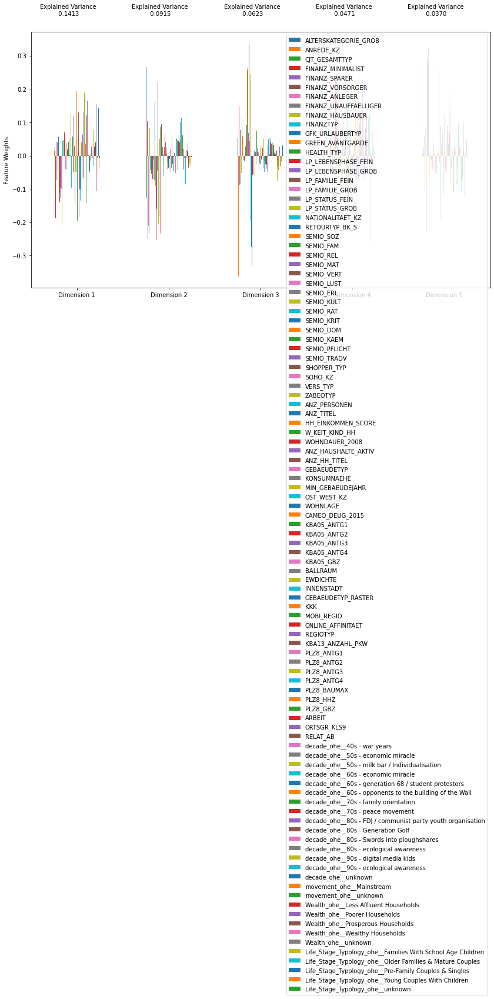

...

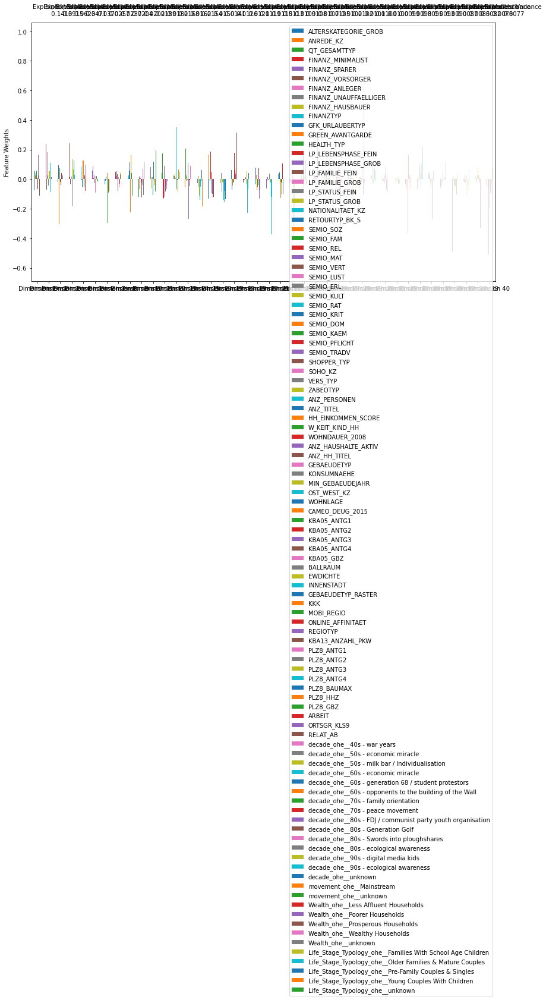

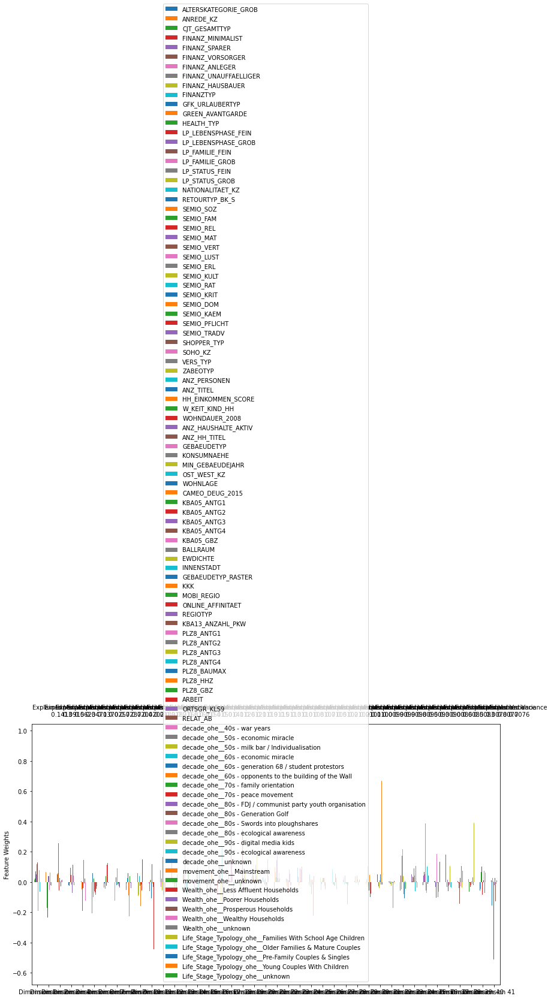

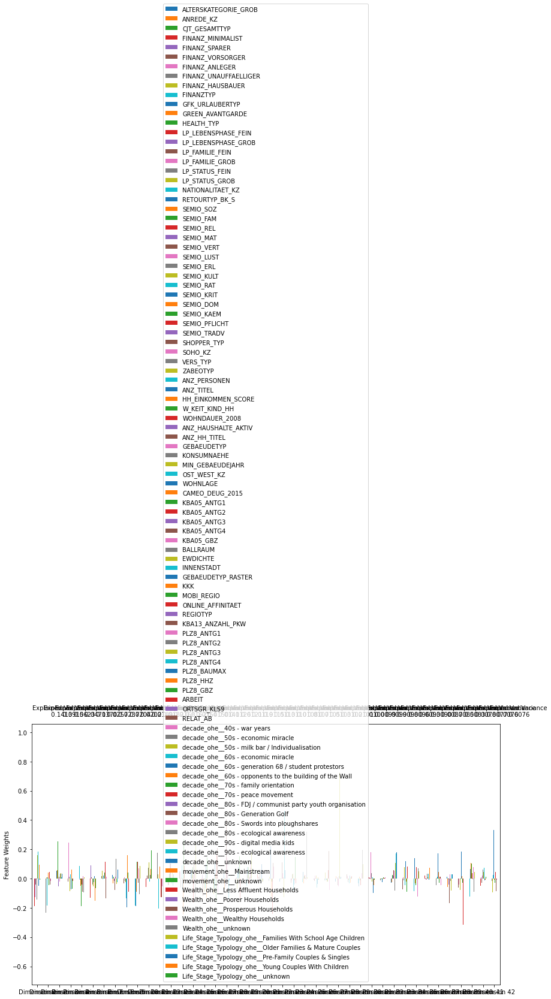

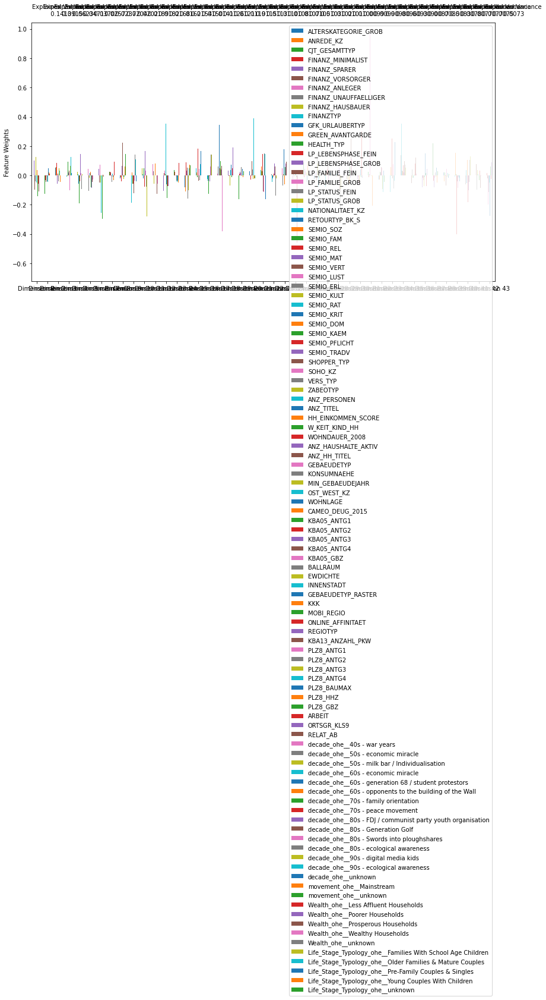

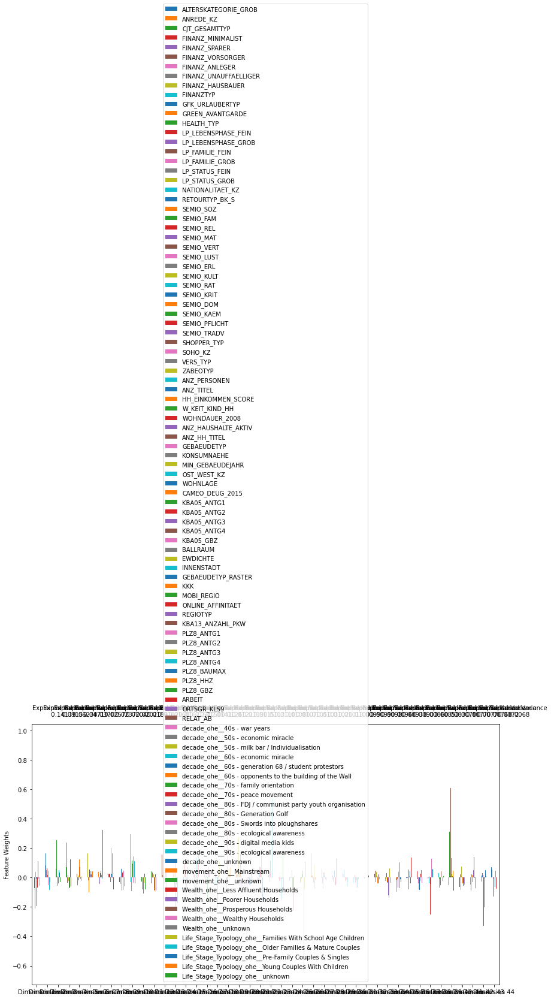

In [77]:
for comp in range(1, azdias_df1_scaled.shape[1]):
    pca, X_pca = do_pca(azdias_df1_scaled,n_components=comp)
    comp_check = pca_results(azdias_df1_scaled, pca)
    if comp_check['Explained Variance'].sum() > 0.85:
        break
        

num_comps = comp_check.shape[0]
print("Using {} components, we can explain {}% of the variability in the original data.".format(comp_check.shape[0],comp_check['Explained Variance'].sum()))
        

In [78]:
# Re-apply PCA to the data while selecting for number of components to retain.

pca, X_pca = do_pca(azdias_df1_scaled,n_components=44)


### Discussion 2.2: Perform Dimensionality Reduction

I have used 44 components which explain 85% of the variability


### Step 2.3: Interpret Principal Components

Now that we have our transformed principal components, it's a nice idea to check out the weight of each variable on the first few components to see if they can be interpreted in some fashion.

As a reminder, each principal component is a unit vector that points in the direction of highest variance (after accounting for the variance captured by earlier principal components). The further a weight is from zero, the more the principal component is in the direction of the corresponding feature. If two features have large weights of the same sign (both positive or both negative), then increases in one tend expect to be associated with increases in the other. To contrast, features with different signs can be expected to show a negative correlation: increases in one variable should result in a decrease in the other.

- To investigate the features, you should map each weight to their corresponding feature name, then sort the features according to weight. The most interesting features for each principal component, then, will be those at the beginning and end of the sorted list. Use the data dictionary document to help you understand these most prominent features, their relationships, and what a positive or negative value on the principal component might indicate.
- You should investigate and interpret feature associations from the first three principal components in this substep. To help facilitate this, you should write a function that you can call at any time to print the sorted list of feature weights, for the *i*-th principal component. This might come in handy in the next step of the project, when you interpret the tendencies of the discovered clusters.

In [79]:
# Map weights for the first principal component to corresponding feature names
# and then print the linked values, sorted by weight.
# HINT: Try defining a function here or in a new cell that you can reuse in the
# other cells.

def print_sorted_weights(names, component):
    """
    Prints principal component weights from highest to lowest
    along with corresponding feature names.
    """
    weights = pca.components_[component]
    weighted_features = list(zip(names, weights))
    weighted_features.sort(key=lambda x: x[1], reverse=True)

    for feature, weight in weighted_features:
        print('{:>20} : {:.2f}'.format(feature, weight))

feature_names = list(azdias_df1_scaled.columns) # replace with your actual feature names

In [80]:
# first component 
print_sorted_weights(feature_names,0)

     CAMEO_DEUG_2015 : 0.19
  HH_EINKOMMEN_SCORE : 0.19
          PLZ8_ANTG3 : 0.19
          PLZ8_ANTG4 : 0.18
         PLZ8_BAUMAX : 0.18
         ORTSGR_KLS9 : 0.16
            EWDICHTE : 0.16
    FINANZ_HAUSBAUER : 0.16
Wealth_ohe__Poorer Households : 0.16
Life_Stage_Typology_ohe__Pre-Family Couples & Singles : 0.14
          PLZ8_ANTG2 : 0.13
         KBA05_ANTG4 : 0.13
            ZABEOTYP : 0.13
              ARBEIT : 0.12
 ANZ_HAUSHALTE_AKTIV : 0.12
         KBA05_ANTG3 : 0.12
            RELAT_AB : 0.11
       FINANZ_SPARER : 0.10
movement_ohe__Mainstream : 0.09
decade_ohe__90s - digital media kids : 0.08
       SEMIO_PFLICHT : 0.07
           SEMIO_REL : 0.07
         GEBAEUDETYP : 0.07
            REGIOTYP : 0.06
           SEMIO_RAT : 0.06
      W_KEIT_KIND_HH : 0.06
     GFK_URLAUBERTYP : 0.06
         SEMIO_TRADV : 0.05
           SEMIO_MAT : 0.05
           SEMIO_FAM : 0.05
    NATIONALITAET_KZ : 0.05
      FINANZ_ANLEGER : 0.04
          SEMIO_KAEM : 0.04
Wealth_ohe__Le

In [81]:
# second component 
print_sorted_weights(feature_names,1)

ALTERSKATEGORIE_GROB : 0.27
    FINANZ_VORSORGER : 0.24
           SEMIO_ERL : 0.22
          SEMIO_LUST : 0.18
      RETOURTYP_BK_S : 0.16
           FINANZTYP : 0.12
      W_KEIT_KIND_HH : 0.12
decade_ohe__60s - economic miracle : 0.11
   FINANZ_MINIMALIST : 0.10
decade_ohe__50s - economic miracle : 0.10
          SEMIO_KRIT : 0.10
         SHOPPER_TYP : 0.10
          SEMIO_KAEM : 0.08
    FINANZ_HAUSBAUER : 0.08
           ANREDE_KZ : 0.07
decade_ohe__40s - war years : 0.06
      WOHNDAUER_2008 : 0.06
decade_ohe__70s - family orientation : 0.06
            EWDICHTE : 0.06
         ORTSGR_KLS9 : 0.05
          PLZ8_ANTG3 : 0.05
           SEMIO_DOM : 0.05
          PLZ8_ANTG4 : 0.05
         PLZ8_BAUMAX : 0.05
decade_ohe__60s - generation 68 / student protestors : 0.05
decade_ohe__50s - milk bar / Individualisation : 0.05
              ARBEIT : 0.04
         KBA05_ANTG4 : 0.04
            RELAT_AB : 0.04
 ANZ_HAUSHALTE_AKTIV : 0.04
     CAMEO_DEUG_2015 : 0.04
          PLZ8_ANTG2 : 

In [82]:
# third component 
print_sorted_weights(feature_names,2)


          SEMIO_VERT : 0.34
           SEMIO_SOZ : 0.26
           SEMIO_FAM : 0.26
          SEMIO_KULT : 0.25
   FINANZ_MINIMALIST : 0.15
           FINANZTYP : 0.11
      RETOURTYP_BK_S : 0.09
           SEMIO_REL : 0.09
    FINANZ_VORSORGER : 0.08
      W_KEIT_KIND_HH : 0.08
           SEMIO_MAT : 0.07
    GREEN_AVANTGARDE : 0.06
         ORTSGR_KLS9 : 0.05
ALTERSKATEGORIE_GROB : 0.05
         PLZ8_BAUMAX : 0.05
            EWDICHTE : 0.05
          PLZ8_ANTG4 : 0.05
          PLZ8_ANTG3 : 0.05
          SEMIO_LUST : 0.04
      LP_STATUS_GROB : 0.04
              ARBEIT : 0.04
decade_ohe__50s - milk bar / Individualisation : 0.04
            RELAT_AB : 0.03
decade_ohe__60s - generation 68 / student protestors : 0.03
decade_ohe__60s - economic miracle : 0.03
Life_Stage_Typology_ohe__Pre-Family Couples & Singles : 0.03
          PLZ8_ANTG2 : 0.03
     CAMEO_DEUG_2015 : 0.03
Wealth_ohe__Poorer Households : 0.03
      LP_STATUS_FEIN : 0.03
      WOHNDAUER_2008 : 0.03
decade_ohe__50s - 

### Discussion 2.3: Interpret Principal Components

The first PCA component has a positive weight (0.19) for the features CAMEO_DEUG_2015, HH_EINKOMMEN_SCORE, and PLZ8_ANTG3. This suggests that an increase in the values of these features is associated with a higher score on this component.

CAMEO_DEUG_2015 represents the German CAMEO classification for the socio-economic status of households, HH_EINKOMMEN_SCORE represents the estimated household income, and PLZ8_ANTG3 represents the number of 6-10 family houses in the PLZ8 region.

Therefore, in the context of this PCA component, higher values of CAMEO_DEUG_2015, HH_EINKOMMEN_SCORE, and PLZ8_ANTG3 contribute positively to the component. This indicates that areas or individuals with higher socio-economic status, higher estimated household income, and a greater presence of 6-10 family houses tend to have higher scores on this component.

On the other hand, the features MOBI_REGIO, LP_STATUS_GROB, and LP_STATUS_FEIN have negative weights (-0.21) in this component. This implies that an increase in the values of these features is associated with a lower score on this component.

MOBI_REGIO represents the mobility status in the person's neighborhood, LP_STATUS_GROB represents the social status on a coarse scale, and LP_STATUS_FEIN represents the social status on a fine scale.

Thus, lower values of MOBI_REGIO, LP_STATUS_GROB, and LP_STATUS_FEIN contribute negatively to the component. This suggests that areas or individuals with lower mobility status and lower social status, both on coarse and fine scales, tend to have lower scores on this component.

Overall, this PCA component captures a combination of factors related to socio-economic status, household income, housing characteristics, mobility status, and social status. The positive and negative weights of the features indicate the direction and strength of their influence on the component, providing insights into the patterns and relationships present in the data.

## Step 3: Clustering

### Step 3.1: Apply Clustering to General Population

You've assessed and cleaned the demographics data, then scaled and transformed them. Now, it's time to see how the data clusters in the principal components space. In this substep, you will apply k-means clustering to the dataset and use the average within-cluster distances from each point to their assigned cluster's centroid to decide on a number of clusters to keep.

- Use sklearn's [KMeans](http://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html#sklearn.cluster.KMeans) class to perform k-means clustering on the PCA-transformed data.
- Then, compute the average difference from each point to its assigned cluster's center. **Hint**: The KMeans object's `.score()` method might be useful here, but note that in sklearn, scores tend to be defined so that larger is better. Try applying it to a small, toy dataset, or use an internet search to help your understanding.
- Perform the above two steps for a number of different cluster counts. You can then see how the average distance decreases with an increasing number of clusters. However, each additional cluster provides a smaller net benefit. Use this fact to select a final number of clusters in which to group the data. **Warning**: because of the large size of the dataset, it can take a long time for the algorithm to resolve. The more clusters to fit, the longer the algorithm will take. You should test for cluster counts through at least 10 clusters to get the full picture, but you shouldn't need to test for a number of clusters above about 30.
- Once you've selected a final number of clusters to use, re-fit a KMeans instance to perform the clustering operation. Make sure that you also obtain the cluster assignments for the general demographics data, since you'll be using them in the final Step 3.3.

In [83]:
from sklearn.cluster import KMeans

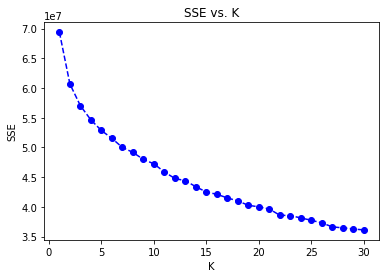

In [84]:
# A place for your work - create a scree plot - you will need to
# Fit a kmeans model with changing k from 1-10
my_dict = {}
for k in range (1,31):
    kmeans_k =KMeans(n_clusters=k,random_state=42)

    # Then fit the model to your data using the fit method
    model_k = kmeans_k.fit(X_pca)

    # Finally predict the labels on the same data to show the category that point belongs to
#     labels_k = model_k.predict(data)

    score = model_k.score(X_pca)
    
    my_dict[k] = abs(score)
# Obtain the score for each model (take the absolute value)

# Plot the score against k
plt.plot(my_dict.keys(), my_dict.values(), linestyle='--', marker='o', color='b');
plt.xlabel('K');
plt.ylabel('SSE');
plt.title('SSE vs. K');

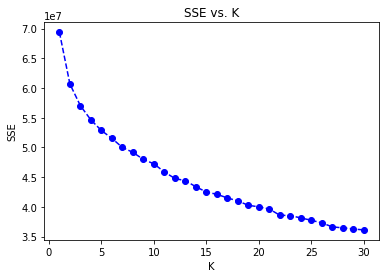

In [85]:
# A place for your work - create a scree plot - you will need to
# Fit a kmeans model with changing k from 1-10
my_dictplus = {}
for k in range (1,31):
    kmeans_kplus =KMeans(n_clusters=k,init='k-means++', n_init=10, max_iter=300, random_state=42)

    # Then fit the model to your data using the fit method
    model_kplus = kmeans_kplus.fit(X_pca)

    # Finally predict the labels on the same data to show the category that point belongs to
#     labels_k = model_k.predict(data)

    score_plus = model_kplus.score(X_pca)
    
    my_dictplus[k] = abs(score_plus)
# Obtain the score for each model (take the absolute value)

# Plot the score against k
plt.plot(my_dictplus.keys(), my_dictplus.values(), linestyle='--', marker='o', color='b');
plt.xlabel('K');
plt.ylabel('SSE');
plt.title('SSE vs. K');

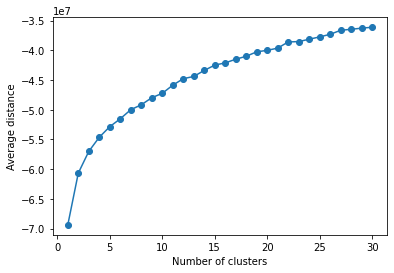

In [86]:
# try out cluster counts from 1 to 30
cluster_counts = range(1, 31)

# initialize an empty list to store the average distances
avg_distances = []

# loop through the different cluster counts and compute the score for each
for cluster_count in cluster_counts:
    kmeans = KMeans(n_clusters=cluster_count, init='k-means++', n_init=10, max_iter=300, random_state=42)
    kmeans.fit(X_pca)
    avg_distances.append(kmeans.score(X_pca))

# plot the average distances versus the number of clusters to visualize the elbow point
import matplotlib.pyplot as plt
plt.plot(cluster_counts, avg_distances, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Average distance')
plt.show()


In [87]:
# from sklearn.metrics import silhouette_score
# # A higher silhouette score indicates better cluster cohesion and separation.
# # X_pca is the input data
# silhouette_scores = []
# for n_clusters in range(2, 31):
#     print(n_clusters)
#     clusterer = KMeans(n_clusters=n_clusters,random_state=42)
#     cluster_labels = clusterer.fit_predict(X_pca)
#     silhouette_avg = silhouette_score(X_pca, cluster_labels)
#     silhouette_scores.append(silhouette_avg)

# optimal_n_clusters = silhouette_scores.index(max(silhouette_scores)) + 2 
# # silhouette_scores list index starts at 0, while the range() function starts at 1


# #  iterate over a range of cluster values and calculate the gap statistic for each, 
# # then choose the number of clusters with the largest gap statistic.
# from sklearn.metrics import pairwise_distances_argmin_min


# # Define the range of clusters to test
# max_k = 31
# ks = range(1, max_k)

# # Compute the within-cluster variance for each value of K
# wks = np.zeros(len(ks))
# for i, k in enumerate(ks):
#     print(i)
#     print(k)
#     # Fit KMeans clustering model on the data
#     km = KMeans(n_clusters=k, random_state=42)
#     km.fit(X_pca)
#     # Get the distances from each data point to its nearest cluster center
#     distances, _ = pairwise_distances_argmin_min(X_pca, km.cluster_centers_)
#     # Compute the within-cluster variance
#     within_cluster_variance = sum(distances**2) / X_pca.shape[0]
#     wks[i] = np.log(within_cluster_variance)

# # Generate B reference datasets and compute their within-cluster variance
# B = 10 # number of reference datasets
# ref_wks = np.zeros((len(ks), B))
# for j in range(B):
#     for i, k in enumerate(ks):
#         # Generate a reference dataset using a uniform distribution
#         Xb = np.random.uniform(X_pca.min(), X_pca.max(), size=X_pca.shape)
#         # Fit KMeans clustering model on the reference dataset
#         km = KMeans(n_clusters=k, random_state=42)
#         km.fit(Xb)
#         # Get the distances from each data point to its nearest cluster center
#         distances, _ = pairwise_distances_argmin_min(Xb, km.cluster_centers_)
#         # Compute the within-cluster variance of the reference dataset
#         within_cluster_variance = sum(distances**2) / Xb.shape[0]
#         ref_wks[i, j] = np.log(within_cluster_variance)

# # Compute the expected within-cluster variance and standard deviation for each value of K
# Ewk = np.mean(ref_wks, axis=1)
# sdwk = np.std(ref_wks, axis=1)

# # Compute the Gap Statistic for each value of K
# gaps = Ewk - wks
# gap_diffs = gaps[:-1] - gaps[1:]
# optimal_k = np.argmax(gap_diffs) + 1

# print("Optimal number of clusters: ", optimal_k)


In [110]:
# fit with 26 clsuters
kmeans_kplus_final =KMeans(n_clusters=26,init='k-means++', n_init=10, max_iter=300, random_state=42)

# Then fit the model to your data using the fit method
model_kplus_final = kmeans_kplus_final.fit(X_pca)

In [116]:
# Obtain cluster labels for the general demographics data
general_demographics_labels = model_kplus_final.predict(X_pca)

In [117]:
general_demographics_labels.shape

(797975,)

In [118]:
# Count the number of customers in each cluster segment
segment_counts_ = np.bincount(general_demographics_labels)

# Print the count of customers in each segment
for segment, count in enumerate(segment_counts_):
    print(f"Segment {segment}: {count} customers")

Segment 0: 42443 customers
Segment 1: 51757 customers
Segment 2: 19278 customers
Segment 3: 39311 customers
Segment 4: 49419 customers
Segment 5: 36056 customers
Segment 6: 43528 customers
Segment 7: 47441 customers
Segment 8: 32456 customers
Segment 9: 20138 customers
Segment 10: 25365 customers
Segment 11: 52707 customers
Segment 12: 49181 customers
Segment 13: 12850 customers
Segment 14: 17830 customers
Segment 15: 31503 customers
Segment 16: 20835 customers
Segment 17: 24487 customers
Segment 18: 15398 customers
Segment 19: 49366 customers
Segment 20: 31936 customers
Segment 21: 50306 customers
Segment 22: 18625 customers
Segment 23: 5701 customers
Segment 24: 6110 customers
Segment 25: 3948 customers


### Discussion 3.1: Apply Clustering to General Population

In the clustering analysis, K-means++ algorithm was used to partition the data into clusters. The K-means++ algorithm is an improvement over the standard K-means algorithm as it initializes the cluster centroids in a smarter way, leading to better convergence and more accurate results.

To determine the optimal number of clusters, the "elbow method" is commonly used, which involves plotting the within-cluster sum of squares (WCSS) against the number of clusters and identifying the point of inflection or "elbow" in the plot. This point typically indicates the optimal number of clusters where the gain in clustering quality starts to diminish.

However, in this particular analysis, when the WCSS was plotted against the number of clusters, there was no clear elbow point observed. This means that there was no distinct point where the gain in clustering quality significantly decreased, making it difficult to determine the optimal number of clusters based on this method alone.

As a result, a subjective approach was used to determine the number of clusters. By visually inspecting the WCSS plot, it was observed that using 26 clusters seemed to provide a reasonable balance between capturing sufficient cluster granularity and avoiding excessive fragmentation.

It is important to note that the choice of 26 clusters by eyeballing is subjective and may not necessarily be the "true" optimal number of clusters for the dataset. Other methods, such as silhouette analysis or domain knowledge, could have been employed to obtain a more objective determination of the optimal number of clusters. However, in the absence of a clear elbow point and considering the specific characteristics of the dataset, 26 clusters were chosen as a reasonable approximation.

Despite the subjective determination of the number of clusters, the analysis can still provide valuable insights into the underlying patterns and structures within the data. By examining the cluster characteristics, feature differences, and interpreting the PCA components, meaningful information can be extracted to understand the distinct segments or groups present in the dataset.

It is important to acknowledge the limitations of the chosen approach and the potential impact it may have on the interpretation of the results. The subjective selection of the number of clusters introduces a degree of uncertainty, and alternative approaches should be considered to validate and refine the clustering analysis in future studies.

### Step 3.2: Apply All Steps to the Customer Data

Now that you have clusters and cluster centers for the general population, it's time to see how the customer data maps on to those clusters. Take care to not confuse this for re-fitting all of the models to the customer data. Instead, you're going to use the fits from the general population to clean, transform, and cluster the customer data. In the last step of the project, you will interpret how the general population fits apply to the customer data.

- Don't forget when loading in the customers data, that it is semicolon (`;`) delimited.
- Apply the same feature wrangling, selection, and engineering steps to the customer demographics using the `clean_data()` function you created earlier. (You can assume that the customer demographics data has similar meaning behind missing data patterns as the general demographics data.)
- Use the sklearn objects from the general demographics data, and apply their transformations to the customers data. That is, you should not be using a `.fit()` or `.fit_transform()` method to re-fit the old objects, nor should you be creating new sklearn objects! Carry the data through the feature scaling, PCA, and clustering steps, obtaining cluster assignments for all of the data in the customer demographics data.

In [151]:
# Load in the customer demographics data.
customers = pd.read_csv("Udacity_CUSTOMERS_Subset.csv",delimiter=';')
customers.head()

,AGER_TYP,ALTERSKATEGORIE_GROB,ANREDE_KZ,CJT_GESAMTTYP,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_VORSORGER,FINANZ_ANLEGER,FINANZ_UNAUFFAELLIGER,FINANZ_HAUSBAUER,...,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_BAUMAX,PLZ8_HHZ,PLZ8_GBZ,ARBEIT,ORTSGR_KLS9,RELAT_AB
0,2,4,1,5.0,5,1,5,1,2,2,...,3.0,3.0,1.0,0.0,1.0,5.0,5.0,1.0,2.0,1.0
1,-1,4,1,NaN,5,1,5,1,3,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,-1,4,2,2.0,5,1,5,1,4,4,...,2.0,3.0,3.0,1.0,3.0,3.0,2.0,3.0,5.0,3.0
3,1,4,1,2.0,5,1,5,2,1,2,...,3.0,2.0,1.0,0.0,1.0,3.0,4.0,1.0,3.0,1.0
4,-1,3,1,6.0,3,1,4,4,5,2,...,2.0,4.0,2.0,1.0,2.0,3.0,3.0,3.0,5.0,1.0


In [152]:
print(customers.shape)
customers_df,customers_df_other = clean_data(customers)
print(customers_df.shape)

(191652, 85)
(191652, 80)
(191652, 80)
(141709, 80)
(49943, 80)
(141709, 103)


In [153]:
customers_df.isnull().sum()

ALTERSKATEGORIE_GROB                                           233
ANREDE_KZ                                                        0
CJT_GESAMTTYP                                                 3124
FINANZ_MINIMALIST                                                0
FINANZ_SPARER                                                    0
                                                              ... 
Life_Stage_Typology_ohe__Families With School Age Children       0
Life_Stage_Typology_ohe__Older Families & Mature Couples         0
Life_Stage_Typology_ohe__Pre-Family Couples & Singles            0
Life_Stage_Typology_ohe__Young Couples With Children             0
Life_Stage_Typology_ohe__unknown                                 0
Length: 103, dtype: int64

In [154]:
# Apply preprocessing, feature transformation, and clustering from the general
# demographics onto the customer data, obtaining cluster predictions for the
# customer demographics data.
# Scale the customers data using the StandardScaler from the general demographics data
customers_scaled = pd.DataFrame(scaler.transform(customers_df), columns=customers_df.columns)

# Re-introduce missing values using the SimpleImputer from the general demographics data
customers_scaled_imputed = pd.DataFrame(imputer.transform(customers_scaled), columns=customers_df.columns)


In [155]:
customers_scaled_imputed.shape

(141709, 103)

In [156]:
customers_scaled_imputed.isnull().sum()

ALTERSKATEGORIE_GROB                                          0
ANREDE_KZ                                                     0
CJT_GESAMTTYP                                                 0
FINANZ_MINIMALIST                                             0
FINANZ_SPARER                                                 0
                                                             ..
Life_Stage_Typology_ohe__Families With School Age Children    0
Life_Stage_Typology_ohe__Older Families & Mature Couples      0
Life_Stage_Typology_ohe__Pre-Family Couples & Singles         0
Life_Stage_Typology_ohe__Young Couples With Children          0
Life_Stage_Typology_ohe__unknown                              0
Length: 103, dtype: int64

In [157]:
X_pca_customers = pca.transform(customers_scaled_imputed)

In [158]:
X_pca_customers.shape

(141709, 44)

In [159]:
customer_cluster_labels = model_kplus_final.predict(X_pca_customers)

In [160]:
customer_cluster_labels.shape

(141709,)

In [161]:
customer_cluster_labels

array([ 9,  9, 11, ...,  9,  1,  1])

In [162]:
# Count the number of customers in each cluster segment
segment_counts = np.bincount(customer_cluster_labels)

# Print the count of customers in each segment
for segment, count in enumerate(segment_counts):
    print(f"Segment {segment}: {count} customers")

Segment 0: 1371 customers
Segment 1: 20581 customers
Segment 2: 8678 customers
Segment 3: 5618 customers
Segment 4: 3892 customers
Segment 5: 1192 customers
Segment 6: 506 customers
Segment 7: 3112 customers
Segment 8: 12001 customers
Segment 9: 22054 customers
Segment 10: 15903 customers
Segment 11: 15339 customers
Segment 12: 6584 customers
Segment 13: 780 customers
Segment 14: 816 customers
Segment 15: 8577 customers
Segment 16: 1609 customers
Segment 17: 2681 customers
Segment 18: 496 customers
Segment 19: 677 customers
Segment 20: 5971 customers
Segment 21: 771 customers
Segment 22: 440 customers
Segment 23: 584 customers
Segment 24: 615 customers
Segment 25: 861 customers


### Step 3.3: Compare Customer Data to Demographics Data

At this point, you have clustered data based on demographics of the general population of Germany, and seen how the customer data for a mail-order sales company maps onto those demographic clusters. In this final substep, you will compare the two cluster distributions to see where the strongest customer base for the company is.

Consider the proportion of persons in each cluster for the general population, and the proportions for the customers. If we think the company's customer base to be universal, then the cluster assignment proportions should be fairly similar between the two. If there are only particular segments of the population that are interested in the company's products, then we should see a mismatch from one to the other. If there is a higher proportion of persons in a cluster for the customer data compared to the general population (e.g. 5% of persons are assigned to a cluster for the general population, but 15% of the customer data is closest to that cluster's centroid) then that suggests the people in that cluster to be a target audience for the company. On the other hand, the proportion of the data in a cluster being larger in the general population than the customer data (e.g. only 2% of customers closest to a population centroid that captures 6% of the data) suggests that group of persons to be outside of the target demographics.

Take a look at the following points in this step:

- Compute the proportion of data points in each cluster for the general population and the customer data. Visualizations will be useful here: both for the individual dataset proportions, but also to visualize the ratios in cluster representation between groups. Seaborn's [`countplot()`](https://seaborn.pydata.org/generated/seaborn.countplot.html) or [`barplot()`](https://seaborn.pydata.org/generated/seaborn.barplot.html) function could be handy.
  - Recall the analysis you performed in step 1.1.3 of the project, where you separated out certain data points from the dataset if they had more than a specified threshold of missing values. If you found that this group was qualitatively different from the main bulk of the data, you should treat this as an additional data cluster in this analysis. Make sure that you account for the number of data points in this subset, for both the general population and customer datasets, when making your computations!
- Which cluster or clusters are overrepresented in the customer dataset compared to the general population? Select at least one such cluster and infer what kind of people might be represented by that cluster. Use the principal component interpretations from step 2.3 or look at additional components to help you make this inference. Alternatively, you can use the `.inverse_transform()` method of the PCA and StandardScaler objects to transform centroids back to the original data space and interpret the retrieved values directly.
- Perform a similar investigation for the underrepresented clusters. Which cluster or clusters are underrepresented in the customer dataset compared to the general population, and what kinds of people are typified by these clusters?

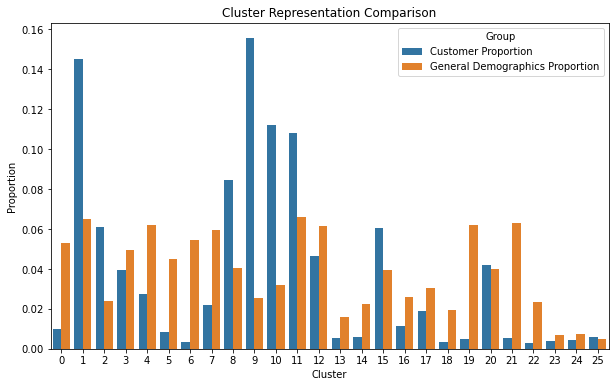

In [163]:
# Calculate the proportions of data in each cluster for customer data
customer_cluster_proportions = np.bincount(customer_cluster_labels) / len(customer_cluster_labels)

# Calculate the proportions of data in each cluster for general demographics data
general_demographics_cluster_proportions = np.bincount(general_demographics_labels) / len(general_demographics_labels)

# Create a DataFrame to store the cluster proportions
cluster_data = pd.DataFrame({
    'Cluster': range(len(customer_cluster_proportions)),
    'Customer Proportion': customer_cluster_proportions,
    'General Demographics Proportion': general_demographics_cluster_proportions
})

# Melt the DataFrame for visualization
melted_data = cluster_data.melt(id_vars='Cluster', var_name='Group', value_name='Proportion')

# Set the figure size
plt.figure(figsize=(10, 6))


# Create  barplot to visualize the ratios
sns.barplot(data=melted_data, x='Cluster', y='Proportion', hue='Group')
plt.xlabel('Cluster')
plt.ylabel('Proportion')
plt.title('Cluster Representation Comparison')
plt.show()



In [164]:
# for general demographics
azdias_df1_other.shape[0]/azdias_df.shape[0]

0.1046272473382023

In [166]:
# for customers group 
customers_df_other.shape[0]/customers.shape[0]

0.2605921148748774

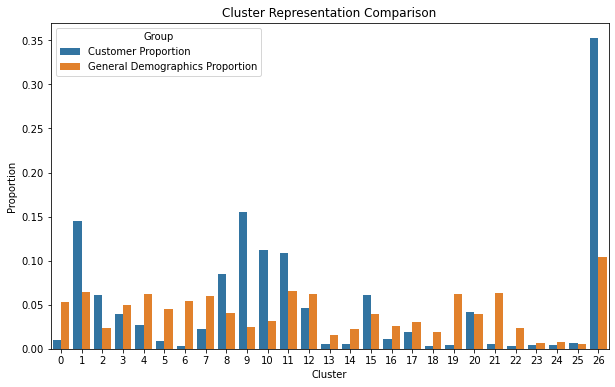

In [167]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the proportions of data in each cluster for customer data
customer_cluster_proportions = np.bincount(customer_cluster_labels) / len(customer_cluster_labels)
customer_cluster_proportions = np.append(customer_cluster_proportions, customers_df_other.shape[0] / customers_df.shape[0])

# Calculate the proportions of data in each cluster for general demographics data
general_demographics_cluster_proportions = np.bincount(general_demographics_labels) / len(general_demographics_labels)
general_demographics_cluster_proportions = np.append(general_demographics_cluster_proportions, azdias_df1_other.shape[0] / azdias_df.shape[0])

# Create a DataFrame to store the cluster proportions
cluster_data = pd.DataFrame({
    'Cluster': range(len(customer_cluster_proportions)),
    'Customer Proportion': customer_cluster_proportions,
    'General Demographics Proportion': general_demographics_cluster_proportions
})

# Melt the DataFrame for visualization
melted_data = cluster_data.melt(id_vars='Cluster', var_name='Group', value_name='Proportion')

# Set the figure size
plt.figure(figsize=(10, 6))

# Create  barplot to visualize the ratios
sns.barplot(data=melted_data, x='Cluster', y='Proportion', hue='Group')
plt.xlabel('Cluster')
plt.ylabel('Proportion')
plt.title('Cluster Representation Comparison')
plt.show()


In [94]:
# What kinds of people are part of a cluster that is overrepresented in the
# customer data compared to the general population?

# cluster 1, 9


In [95]:
# What kinds of people are part of a cluster that is underrepresented in the
# customer data compared to the general population?

# cluster 19,6

In [175]:
cluster_centroids = model_kplus_final.cluster_centers_
cluster_centroids.shape

(26, 44)

In [180]:
# Inverse transform the cluster centroids back to the PCA space
centroids_pca = pca.inverse_transform(cluster_centroids)
print(centroids_pca.shape)
# Scale the centroids back to the original feature space
centroids_original = scaler.inverse_transform(centroids_pca)
print(centroids_original.shape)

(26, 103)
(26, 103)


In [249]:
# Create a DataFrame to store the centroid values
centroids_df = pd.DataFrame(centroids_original, columns=azdias_df1.columns)

# Interpret the retrieved centroid values
for i, centroid in centroids_df.iterrows():
    print(f"Cluster {i} centroid:")
    print(centroid)
    print()


Cluster 0 centroid:
ALTERSKATEGORIE_GROB                                          1.908331
ANREDE_KZ                                                     0.959952
CJT_GESAMTTYP                                                 4.291344
FINANZ_MINIMALIST                                             2.911720
FINANZ_SPARER                                                 4.146499
                                                                ...   
Life_Stage_Typology_ohe__Families With School Age Children    0.252293
Life_Stage_Typology_ohe__Older Families & Mature Couples      0.343316
Life_Stage_Typology_ohe__Pre-Family Couples & Singles         0.150801
Life_Stage_Typology_ohe__Young Couples With Children          0.145063
Life_Stage_Typology_ohe__unknown                              0.000491
Name: 0, Length: 103, dtype: float64

Cluster 1 centroid:
ALTERSKATEGORIE_GROB                                          3.358816
ANREDE_KZ                                                     1.452126

In [250]:
# set options to display all rows and columns
pd.options.display.max_rows = None
pd.options.display.max_columns = None

In [260]:
# Iterate over the clusters
for cluster in centroids_df.index:
    # Get the feature weights for the current cluster
    feature_weights = abs(centroids_df.loc[cluster])
    
    # Sort the feature weights in descending order
    sorted_weights = feature_weights.sort_values(ascending=False)
    
    # Get the top 5 features for the current cluster
    top_features = sorted_weights[:6]
    
    print(f"Top features for Cluster {cluster}:")
    print(top_features)
    print()


Top features for Cluster 0:
MIN_GEBAEUDEJAHR       1994.133386
KBA13_ANZAHL_PKW        696.504125
LP_LEBENSPHASE_FEIN      17.721011
GFK_URLAUBERTYP           7.832805
WOHNDAUER_2008            7.510153
SEMIO_KULT                6.795776
Name: 0, dtype: float64

Top features for Cluster 1:
MIN_GEBAEUDEJAHR       1994.034356
KBA13_ANZAHL_PKW        662.413785
LP_LEBENSPHASE_FEIN      34.925964
LP_LEBENSPHASE_GROB      10.663454
LP_FAMILIE_FEIN           9.555466
WOHNDAUER_2008            8.694291
Name: 1, dtype: float64

Top features for Cluster 2:
MIN_GEBAEUDEJAHR       1992.977841
KBA13_ANZAHL_PKW        600.201093
LP_LEBENSPHASE_FEIN      12.954977
ANZ_HAUSHALTE_AKTIV      10.509970
WOHNDAUER_2008            8.484172
GFK_URLAUBERTYP           6.740479
Name: 2, dtype: float64

Top features for Cluster 3:
MIN_GEBAEUDEJAHR       1992.476819
KBA13_ANZAHL_PKW        578.038206
LP_LEBENSPHASE_FEIN      12.825240
ANZ_HAUSHALTE_AKTIV      11.314074
WOHNDAUER_2008            8.263399
GFK_URLA

###### 3.5. MIN_GEBAEUDEJAHR
First year building was mentioned in the database
- missing values encoded by 0
###### 8.1. KBA13_ANZAHL_PKW
Number of cars in the PLZ8 region

###### 1.11. LP_LEBENSPHASE_FEIN
Life stage, fine scale

###### 1.12. LP_LEBENSPHASE_GROB
Life stage, rough scale


###### 1.13. LP_FAMILIE_FEIN
Family type, fine scale

###### 1.15. LP_STATUS_FEIN
Social status, fine scale


###### 2.7. WOHNDAUER_2008
Length of residence

###### 1.8. GFK_URLAUBERTYP
Vacation habits

###### 3.1. ANZ_HAUSHALTE_AKTIV
Number of households in the building

OVEREPRESENTED FOR CUSTOMERS



**Cluster 1:**
- MIN_GEBAEUDEJAHR: 1994.034356
- KBA13_ANZAHL_PKW: 662.413785
- LP_LEBENSPHASE_FEIN: 34.925964
- LP_LEBENSPHASE_GROB: 10.663454
- LP_FAMILIE_FEIN: 9.555466
- WOHNDUER_2008: 8.694291

**Cluster 9:**
- MIN_GEBAEUDEJAHR: 1992.363429
- KBA13_ANZAHL_PKW: 664.834450
- LP_LEBENSPHASE_FEIN: 22.448273
- WOHNDUER_2008: 8.763495
- LP_STATUS_FEIN: 8.636098
- GFK_URLAUBERTYP: 6.623487


UNDEREPRESENTED FOR CUSTOMERS

**Cluster 19:**
- MIN_GEBAEUDEJAHR       1992.572919
- KBA13_ANZAHL_PKW        474.243093
- ANZ_HAUSHALTE_AKTIV      15.940789
- LP_LEBENSPHASE_FEIN      10.625209
- GFK_URLAUBERTYP           8.774817
- CAMEO_DEUG_2015           7.859845

**Cluster 6:**
- MIN_GEBAEUDEJAHR: 1992.981986
- KBA13_ANZAHL_PKW: 736.365181
- GFK_URLAUBERTYP: 8.696209
- LP_LEBENSPHASE_FEIN: 7.926120
- WOHNDUER_2008: 6.975387
- ANZ_HAUSHALTE_AKTIV: 6.580546




In [262]:
customers_df['clusters'] = customer_cluster_labels
customers_df.shape

(141709, 104)

In [265]:
customers_df.head()

,ALTERSKATEGORIE_GROB,ANREDE_KZ,CJT_GESAMTTYP,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_VORSORGER,FINANZ_ANLEGER,FINANZ_UNAUFFAELLIGER,FINANZ_HAUSBAUER,FINANZTYP,GFK_URLAUBERTYP,GREEN_AVANTGARDE,HEALTH_TYP,LP_LEBENSPHASE_FEIN,LP_LEBENSPHASE_GROB,LP_FAMILIE_FEIN,LP_FAMILIE_GROB,LP_STATUS_FEIN,LP_STATUS_GROB,NATIONALITAET_KZ,RETOURTYP_BK_S,SEMIO_SOZ,SEMIO_FAM,SEMIO_REL,SEMIO_MAT,SEMIO_VERT,SEMIO_LUST,SEMIO_ERL,SEMIO_KULT,SEMIO_RAT,SEMIO_KRIT,SEMIO_DOM,SEMIO_KAEM,SEMIO_PFLICHT,SEMIO_TRADV,SHOPPER_TYP,SOHO_KZ,VERS_TYP,ZABEOTYP,ANZ_PERSONEN,ANZ_TITEL,HH_EINKOMMEN_SCORE,W_KEIT_KIND_HH,WOHNDAUER_2008,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,GEBAEUDETYP,KONSUMNAEHE,MIN_GEBAEUDEJAHR,OST_WEST_KZ,WOHNLAGE,CAMEO_DEUG_2015,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_GBZ,BALLRAUM,EWDICHTE,INNENSTADT,GEBAEUDETYP_RASTER,KKK,MOBI_REGIO,ONLINE_AFFINITAET,REGIOTYP,KBA13_ANZAHL_PKW,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_BAUMAX,PLZ8_HHZ,PLZ8_GBZ,ARBEIT,ORTSGR_KLS9,RELAT_AB,decade_ohe__40s - war years,decade_ohe__50s - economic miracle,decade_ohe__50s - milk bar / Individualisation,decade_ohe__60s - economic miracle,decade_ohe__60s - generation 68 / student protestors,decade_ohe__60s - opponents to the building of the Wall,decade_ohe__70s - family orientation,decade_ohe__70s - peace movement,decade_ohe__80s - FDJ / communist party youth organisation,decade_ohe__80s - Generation Golf,decade_ohe__80s - Swords into ploughshares,decade_ohe__80s - ecological awareness,decade_ohe__90s - digital media kids,decade_ohe__90s - ecological awareness,decade_ohe__unknown,movement_ohe__Mainstream,movement_ohe__unknown,Wealth_ohe__Less Affluent Households,Wealth_ohe__Poorer Households,Wealth_ohe__Prosperous Households,Wealth_ohe__Wealthy Households,Wealth_ohe__unknown,Life_Stage_Typology_ohe__Families With School Age Children,Life_Stage_Typology_ohe__Older Families & Mature Couples,Life_Stage_Typology_ohe__Pre-Family Couples & Singles,Life_Stage_Typology_ohe__Young Couples With Children,Life_Stage_Typology_ohe__unknown,clusters
0,4.0,1,5.0,5,1,5,1,2,2,2,4.0,1,1.0,20.0,5.0,2.0,2.0,10.0,5.0,1.0,5.0,6,5,2,6,6,7,3,4,1,3,1,1,2,1,3.0,0.0,1.0,3,2.0,0.0,1.0,6.0,9.0,1.0,0.0,1.0,5.0,1992.0,1,7.0,1.0,2.0,2.0,0.0,0.0,4.0,3.0,2.0,4.0,4.0,1.0,4.0,3.0,1.0,1201.0,3.0,3.0,1.0,0.0,1.0,5.0,5.0,1.0,2.0,1.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,9
2,4.0,2,2.0,5,1,5,1,4,4,2,3.0,1,2.0,13.0,3.0,1.0,1.0,10.0,5.0,1.0,5.0,2,2,1,3,3,7,7,1,2,7,5,6,4,1,1.0,0.0,2.0,3,1.0,0.0,1.0,6.0,9.0,1.0,0.0,8.0,1.0,1992.0,1,2.0,5.0,2.0,2.0,0.0,0.0,3.0,7.0,4.0,1.0,3.0,3.0,3.0,1.0,7.0,433.0,2.0,3.0,3.0,1.0,3.0,3.0,2.0,3.0,5.0,3.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,9
3,4.0,1,2.0,5,1,5,2,1,2,6,10.0,0,2.0,NaN,NaN,NaN,NaN,9.0,4.0,1.0,3.0,6,5,3,4,7,5,3,4,3,3,3,3,3,4,0.0,0.0,1.0,1,0.0,0.0,4.0,NaN,9.0,NaN,NaN,2.0,2.0,1992.0,1,7.0,4.0,3.0,0.0,0.0,0.0,4.0,7.0,1.0,7.0,4.0,3.0,4.0,2.0,6.0,755.0,3.0,2.0,1.0,0.0,1.0,3.0,4.0,1.0,3.0,1.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,11
4,3.0,1,6.0,3,1,4,4,5,2,2,2.0,0,3.0,31.0,10.0,10.0,5.0,1.0,1.0,1.0,5.0,4,5,4,6,5,6,4,5,5,3,5,2,5,4,1.0,0.0,2.0,1,4.0,0.0,6.0,2.0,9.0,7.0,0.0,3.0,1.0,1992.0,1,3.0,7.0,0.0,3.0,2.0,0.0,3.0,3.0,4.0,4.0,3.0,4.0,3.0,5.0,7.0,513.0,2.0,4.0,2.0,1.0,2.0,3.0,3.0,3.0,5.0,1.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,4
5,3.0,1,4.0,5,1,5,1,2,3,5,11.0,1,3.0,17.0,5.0,2.0,2.0,7.0,3.0,1.0,3.0,6,4,4,1,7,6,4,6,2,5,5,3,3,4,1.0,0.0,2.0,2,2.0,0.0,1.0,6.0,9.0,1.0,0.0,1.0,2.0,1992.0,1,1.0,5.0,2.0,2.0,1.0,0.0,3.0,7.0,5.0,8.0,4.0,2.0,3.0,3.0,3.0,1167.0,2.0,3.0,2.0,1.0,1.0,5.0,5.0,3.0,7.0,5.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,9


In [264]:
azdias_df1['clusters']  = general_demographics_labels 
azdias_df1.shape

(797975, 104)

In [266]:
azdias_df1.head()

,ALTERSKATEGORIE_GROB,ANREDE_KZ,CJT_GESAMTTYP,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_VORSORGER,FINANZ_ANLEGER,FINANZ_UNAUFFAELLIGER,FINANZ_HAUSBAUER,FINANZTYP,GFK_URLAUBERTYP,GREEN_AVANTGARDE,HEALTH_TYP,LP_LEBENSPHASE_FEIN,LP_LEBENSPHASE_GROB,LP_FAMILIE_FEIN,LP_FAMILIE_GROB,LP_STATUS_FEIN,LP_STATUS_GROB,NATIONALITAET_KZ,RETOURTYP_BK_S,SEMIO_SOZ,SEMIO_FAM,SEMIO_REL,SEMIO_MAT,SEMIO_VERT,SEMIO_LUST,SEMIO_ERL,SEMIO_KULT,SEMIO_RAT,SEMIO_KRIT,SEMIO_DOM,SEMIO_KAEM,SEMIO_PFLICHT,SEMIO_TRADV,SHOPPER_TYP,SOHO_KZ,VERS_TYP,ZABEOTYP,ANZ_PERSONEN,ANZ_TITEL,HH_EINKOMMEN_SCORE,W_KEIT_KIND_HH,WOHNDAUER_2008,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,GEBAEUDETYP,KONSUMNAEHE,MIN_GEBAEUDEJAHR,OST_WEST_KZ,WOHNLAGE,CAMEO_DEUG_2015,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_GBZ,BALLRAUM,EWDICHTE,INNENSTADT,GEBAEUDETYP_RASTER,KKK,MOBI_REGIO,ONLINE_AFFINITAET,REGIOTYP,KBA13_ANZAHL_PKW,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_BAUMAX,PLZ8_HHZ,PLZ8_GBZ,ARBEIT,ORTSGR_KLS9,RELAT_AB,decade_ohe__40s - war years,decade_ohe__50s - economic miracle,decade_ohe__50s - milk bar / Individualisation,decade_ohe__60s - economic miracle,decade_ohe__60s - generation 68 / student protestors,decade_ohe__60s - opponents to the building of the Wall,decade_ohe__70s - family orientation,decade_ohe__70s - peace movement,decade_ohe__80s - FDJ / communist party youth organisation,decade_ohe__80s - Generation Golf,decade_ohe__80s - Swords into ploughshares,decade_ohe__80s - ecological awareness,decade_ohe__90s - digital media kids,decade_ohe__90s - ecological awareness,decade_ohe__unknown,movement_ohe__Mainstream,movement_ohe__unknown,Wealth_ohe__Less Affluent Households,Wealth_ohe__Poorer Households,Wealth_ohe__Prosperous Households,Wealth_ohe__Wealthy Households,Wealth_ohe__unknown,Life_Stage_Typology_ohe__Families With School Age Children,Life_Stage_Typology_ohe__Older Families & Mature Couples,Life_Stage_Typology_ohe__Pre-Family Couples & Singles,Life_Stage_Typology_ohe__Young Couples With Children,Life_Stage_Typology_ohe__unknown,clusters
1,1.0,2,5.0,1,5,2,5,4,5,1,10.0,0,3.0,21.0,6.0,5.0,3.0,2.0,1.0,1.0,1.0,5,4,4,3,1,2,2,3,6,4,7,4,7,6,3.0,1.0,2.0,5,2.0,0.0,6.0,3.0,9.0,11.0,0.0,8.0,1.0,1992.0,1,4.0,8.0,0.0,0.0,0.0,2.0,1.0,6.0,3.0,8.0,3.0,2.0,1.0,3.0,3.0,963.0,2.0,3.0,2.0,1.0,1.0,5.0,4.0,3.0,5.0,4.0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,19
2,3.0,2,3.0,1,4,1,2,3,5,1,10.0,1,3.0,3.0,1.0,1.0,1.0,3.0,2.0,1.0,3.0,4,1,3,3,4,4,6,3,4,7,7,7,3,3,2.0,0.0,1.0,5,1.0,0.0,4.0,3.0,9.0,10.0,0.0,1.0,5.0,1992.0,1,2.0,4.0,1.0,3.0,1.0,0.0,3.0,2.0,4.0,4.0,4.0,2.0,3.0,2.0,2.0,712.0,3.0,3.0,1.0,0.0,1.0,4.0,4.0,3.0,5.0,2.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,14
3,4.0,2,2.0,4,2,5,2,1,2,6,1.0,0,2.0,NaN,NaN,NaN,NaN,9.0,4.0,1.0,2.0,5,1,2,1,4,4,7,4,3,4,4,5,4,4,1.0,0.0,1.0,3,0.0,0.0,1.0,NaN,9.0,1.0,0.0,1.0,4.0,1997.0,1,7.0,2.0,4.0,1.0,0.0,0.0,4.0,4.0,2.0,6.0,4.0,NaN,4.0,1.0,NaN,596.0,2.0,2.0,2.0,0.0,1.0,3.0,4.0,2.0,3.0,3.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,12
4,3.0,1,5.0,4,3,4,1,3,2,5,5.0,0,3.0,32.0,10.0,10.0,5.0,3.0,2.0,1.0,5.0,6,4,4,2,7,4,4,6,2,3,2,2,4,2,2.0,0.0,2.0,4,4.0,0.0,5.0,2.0,9.0,3.0,0.0,1.0,4.0,1992.0,1,3.0,6.0,1.0,4.0,1.0,0.0,3.0,2.0,5.0,1.0,5.0,3.0,3.0,5.0,5.0,435.0,2.0,4.0,2.0,1.0,2.0,3.0,3.0,4.0,6.0,5.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,4
5,1.0,2,2.0,3,1,5,2,2,5,2,1.0,0,3.0,8.0,2.0,1.0,1.0,4.0,2.0,1.0,3.0,2,4,7,4,2,2,2,5,7,4,4,4,7,6,0.0,0.0,2.0,4,1.0,0.0,5.0,6.0,9.0,5.0,0.0,1.0,5.0,1992.0,1,7.0,8.0,2.0,2.0,0.0,0.0,4.0,6.0,2.0,7.0,4.0,4.0,4.0,1.0,5.0,1300.0,2.0,3.0,1.0,1.0,1.0,5.0,5.0,2.0,3.0,3.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,6


In [277]:
# check cluster 1
cl1_cust = customers_df[customers_df['clusters'] == 1][['MIN_GEBAEUDEJAHR','KBA13_ANZAHL_PKW','LP_LEBENSPHASE_FEIN','LP_LEBENSPHASE_GROB','LP_FAMILIE_FEIN','WOHNDAUER_2008']]
cl1_all = azdias_df1[azdias_df1['clusters'] == 1][['MIN_GEBAEUDEJAHR','KBA13_ANZAHL_PKW','LP_LEBENSPHASE_FEIN','LP_LEBENSPHASE_GROB','LP_FAMILIE_FEIN','WOHNDAUER_2008']]

In [274]:
cl1_cust_stats = cl1_cust.describe()
cl1_cust_stats_mean = cl1_cust_stats.loc['mean']
print(cl1_cust_stats_mean)
cluster_1_mode = cl1_cust.mode().iloc[0]
print(cluster_1_mode)

MIN_GEBAEUDEJAHR       1993.437248
KBA13_ANZAHL_PKW        706.099356
LP_LEBENSPHASE_FEIN      36.017346
LP_LEBENSPHASE_GROB      11.370316
LP_FAMILIE_FEIN          10.049335
WOHNDAUER_2008            8.888878
Name: mean, dtype: float64
MIN_GEBAEUDEJAHR       1992.0
KBA13_ANZAHL_PKW       1400.0
LP_LEBENSPHASE_FEIN      38.0
LP_LEBENSPHASE_GROB      12.0
LP_FAMILIE_FEIN          10.0
WOHNDAUER_2008            9.0
Name: 0, dtype: float64


In [276]:
cl1_all_stats = cl1_all.describe()
cl1_all_stats_mean = cl1_all_stats.loc['mean']
print(cl1_all_stats_mean)
cluster_1_mode_all = cl1_all.mode().iloc[0]
print(cluster_1_mode_all)

MIN_GEBAEUDEJAHR       1993.945263
KBA13_ANZAHL_PKW        658.918995
LP_LEBENSPHASE_FEIN      34.650911
LP_LEBENSPHASE_GROB      10.969036
LP_FAMILIE_FEIN           9.768103
WOHNDAUER_2008            8.695442
Name: mean, dtype: float64
MIN_GEBAEUDEJAHR       1992.0
KBA13_ANZAHL_PKW       1400.0
LP_LEBENSPHASE_FEIN      37.0
LP_LEBENSPHASE_GROB      12.0
LP_FAMILIE_FEIN          10.0
WOHNDAUER_2008            9.0
Name: 0, dtype: float64


In [304]:
def analyze_cluster(cluster_number):
    column_list = ['MIN_GEBAEUDEJAHR', 'KBA13_ANZAHL_PKW', 'LP_LEBENSPHASE_FEIN', 'LP_LEBENSPHASE_GROB', 'LP_FAMILIE_FEIN', 'WOHNDAUER_2008', 'LP_STATUS_FEIN', 'GFK_URLAUBERTYP', 'ANZ_HAUSHALTE_AKTIV']
    cl_cust = customers_df[customers_df['clusters'] == cluster_number][column_list]
#     cl_all = azdias_df1[azdias_df1['clusters'] == cluster_number][column_list]

    cl_cust_stats = cl_cust.describe()
    cl_cust_stats_mean = cl_cust_stats.loc['mean']
    print(f"Cluster {cluster_number} - Customers Mean:")
    print(cl_cust_stats_mean)

    cluster_mode_cust = cl_cust.mode().iloc[0]
    print(f"Cluster {cluster_number} - Customers Mode:")
    print(cluster_mode_cust)
    
    cluster_median_cust = cl_cust_stats.loc['50%']
    print(f"Cluster {cluster_number} - Customers Median:")
    print(cluster_median_cust)

#     cl_all_stats = cl_all.describe()
#     cl_all_stats_mean = cl_all_stats.loc['mean']
#     print(f"Cluster {cluster_number} - All Mean:")
#     print(cl_all_stats_mean)

#     cluster_mode_all = cl_all.mode().iloc[0]
#     print(f"Cluster {cluster_number} - All Mode:")
#     print(cluster_mode_all)


In [305]:
analyze_cluster(1)

Cluster 1 - Customers Mean:
MIN_GEBAEUDEJAHR       1993.437248
KBA13_ANZAHL_PKW        706.099356
LP_LEBENSPHASE_FEIN      36.017346
LP_LEBENSPHASE_GROB      11.370316
LP_FAMILIE_FEIN          10.049335
WOHNDAUER_2008            8.888878
LP_STATUS_FEIN            8.362246
GFK_URLAUBERTYP           6.436176
ANZ_HAUSHALTE_AKTIV       1.594643
Name: mean, dtype: float64
Cluster 1 - Customers Mode:
MIN_GEBAEUDEJAHR       1992.0
KBA13_ANZAHL_PKW       1400.0
LP_LEBENSPHASE_FEIN      38.0
LP_LEBENSPHASE_GROB      12.0
LP_FAMILIE_FEIN          10.0
WOHNDAUER_2008            9.0
LP_STATUS_FEIN            9.0
GFK_URLAUBERTYP          10.0
ANZ_HAUSHALTE_AKTIV       1.0
Name: 0, dtype: float64
Cluster 1 - Customers Median:
MIN_GEBAEUDEJAHR       1992.0
KBA13_ANZAHL_PKW        621.0
LP_LEBENSPHASE_FEIN      37.0
LP_LEBENSPHASE_GROB      12.0
LP_FAMILIE_FEIN          10.0
WOHNDAUER_2008            9.0
LP_STATUS_FEIN            9.0
GFK_URLAUBERTYP           7.0
ANZ_HAUSHALTE_AKTIV       1.0
Name: 50

In [307]:
analyze_cluster(9)

Cluster 9 - Customers Mean:
MIN_GEBAEUDEJAHR       1992.411943
KBA13_ANZAHL_PKW        674.542992
LP_LEBENSPHASE_FEIN      27.161974
LP_LEBENSPHASE_GROB       7.888820
LP_FAMILIE_FEIN           5.899805
WOHNDAUER_2008            8.888274
LP_STATUS_FEIN            8.760854
GFK_URLAUBERTYP           6.689693
ANZ_HAUSHALTE_AKTIV       1.891389
Name: mean, dtype: float64
Cluster 9 - Customers Mode:
MIN_GEBAEUDEJAHR       1992.0
KBA13_ANZAHL_PKW       1400.0
LP_LEBENSPHASE_FEIN      40.0
LP_LEBENSPHASE_GROB      12.0
LP_FAMILIE_FEIN          10.0
WOHNDAUER_2008            9.0
LP_STATUS_FEIN           10.0
GFK_URLAUBERTYP          10.0
ANZ_HAUSHALTE_AKTIV       1.0
Name: 0, dtype: float64
Cluster 9 - Customers Median:
MIN_GEBAEUDEJAHR       1992.0
KBA13_ANZAHL_PKW        607.0
LP_LEBENSPHASE_FEIN      20.0
LP_LEBENSPHASE_GROB       5.0
LP_FAMILIE_FEIN           2.0
WOHNDAUER_2008            9.0
LP_STATUS_FEIN           10.0
GFK_URLAUBERTYP           7.0
ANZ_HAUSHALTE_AKTIV       1.0
Name: 50

In [306]:
analyze_cluster(6)

Cluster 6 - Customers Mean:
MIN_GEBAEUDEJAHR       1993.209486
KBA13_ANZAHL_PKW        777.973948
LP_LEBENSPHASE_FEIN       8.025751
LP_LEBENSPHASE_GROB       2.567452
LP_FAMILIE_FEIN           1.927350
WOHNDAUER_2008            7.037549
LP_STATUS_FEIN            2.906883
GFK_URLAUBERTYP           8.305668
ANZ_HAUSHALTE_AKTIV       6.630219
Name: mean, dtype: float64
Cluster 6 - Customers Mode:
MIN_GEBAEUDEJAHR       1992.0
KBA13_ANZAHL_PKW       1400.0
LP_LEBENSPHASE_FEIN       1.0
LP_LEBENSPHASE_GROB       1.0
LP_FAMILIE_FEIN           1.0
WOHNDAUER_2008            9.0
LP_STATUS_FEIN            2.0
GFK_URLAUBERTYP          12.0
ANZ_HAUSHALTE_AKTIV       3.0
Name: 0, dtype: float64
Cluster 6 - Customers Median:
MIN_GEBAEUDEJAHR       1992.0
KBA13_ANZAHL_PKW        695.0
LP_LEBENSPHASE_FEIN       4.0
LP_LEBENSPHASE_GROB       1.0
LP_FAMILIE_FEIN           1.0
WOHNDAUER_2008            8.0
LP_STATUS_FEIN            2.0
GFK_URLAUBERTYP          10.0
ANZ_HAUSHALTE_AKTIV       5.0
Name: 50

In [308]:
analyze_cluster(19)

Cluster 19 - Customers Mean:
MIN_GEBAEUDEJAHR       1992.459380
KBA13_ANZAHL_PKW        448.961194
LP_LEBENSPHASE_FEIN      12.140575
LP_LEBENSPHASE_GROB       3.939297
LP_FAMILIE_FEIN           3.586262
WOHNDAUER_2008            7.184638
LP_STATUS_FEIN            1.812121
GFK_URLAUBERTYP           8.271212
ANZ_HAUSHALTE_AKTIV      14.376662
Name: mean, dtype: float64
Cluster 19 - Customers Mode:
MIN_GEBAEUDEJAHR       1992.0
KBA13_ANZAHL_PKW        283.0
LP_LEBENSPHASE_FEIN       1.0
LP_LEBENSPHASE_GROB       1.0
LP_FAMILIE_FEIN           1.0
WOHNDAUER_2008            9.0
LP_STATUS_FEIN            1.0
GFK_URLAUBERTYP          12.0
ANZ_HAUSHALTE_AKTIV       9.0
Name: 0, dtype: float64
Cluster 19 - Customers Median:
MIN_GEBAEUDEJAHR       1992.0
KBA13_ANZAHL_PKW        410.0
LP_LEBENSPHASE_FEIN       5.0
LP_LEBENSPHASE_GROB       2.0
LP_FAMILIE_FEIN           1.0
WOHNDAUER_2008            8.0
LP_STATUS_FEIN            1.0
GFK_URLAUBERTYP          10.0
ANZ_HAUSHALTE_AKTIV      11.0
Name:

### Discussion 3.3: Compare Customer Data to Demographics Data


In the clustering analysis, several features were identified as overrepresented or underrepresented among the clusters, indicating their popularity or lack of popularity with the mail order service. Here is a summary of the findings for each feature:

**LP_LEBENSPHASE_FEIN:**

- Overrepresented: Homeowners at retirement age from multiperson households and top earners at retirement age from multiperson households.
- Underrepresented: Single low-income earners of younger age.

**LP_LEBENSPHASE_GROB:**

- Overrepresented: High-income earners of higher age from multiperson households.
- Underrepresented: Single low-income and average earners of younger age.

**LP_FAMILIE_FEIN:**

- Overrepresented: Two-generational households.

- Underrepresented: Single individuals.

**LP_STATUS_FEIN:**

- Overrepresented: Houseowners and top earners.
- Underrepresented: Orientation-seeking low-income earners and typical low-income earners.

**GFK_URLAUBERTYP:**

- Overrepresented: Connoisseurs.

- Underrepresented: Individuals without vacation.

**KBA13_ANZAHL_PKW:**

- Overrepresented: Clusters with a median number of cars, specifically with values 621 and 607.

- Underrepresented: Clusters with values 695 and 610.

These findings suggest that certain customer segments, such as homeowners at retirement age, top earners, and two-generational households, are more likely to be popular with the mail order service. On the other hand, clusters consisting of single individuals, single low-income earners, and individuals without vacation tend to be underrepresented or less popular.

These insights can help the mail order service tailor their marketing and targeting strategies to focus more on the overrepresented segments and potentially explore ways to attract the underrepresented segments. By understanding the characteristics and preferences of different clusters, the mail order service can effectively customize their offerings and communication to better meet the needs and interests of their target customers.

It is important to note that these conclusions are based on the specific dataset and clustering analysis performed. Further analysis and validation using additional data sources or domain expertise are recommended to gain a more comprehensive understanding of the target market and customer preferences.